# MALCA Q Metric Template Experiments

This notebook is for understanding why the current `stats_variability_quasi_periodicity_q` can disagree with visual phase-fold intuition.

It compares several Q implementations:

- current MALCA Q: 50-bin median template, 3-bin circular smoothing, noise-subtracted variance ratio
- empirical median templates with 50, 100, 150, 200, 300, 500, and 1000 bins
- no-smoothing versus smoothed templates
- noise-subtracted Cody-style Q versus plain variance/scatter reduction
- raw camera/band-normalized magnitudes versus review-style baseline residuals
- optional phase-GP template, disabled by default

Low Q means the phase template explains the light curve. High Q means the folded template leaves most of the scatter behind.

In [1]:
from __future__ import annotations

from pathlib import Path
import json
import math
import sqlite3
import sys
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

pd.set_option("display.max_columns", 120)
pd.set_option("display.width", 180)
plt.rcParams["figure.dpi"] = 120

def find_repo_root(start: Path | None = None) -> Path:
    start = (start or Path.cwd()).resolve()
    for path in (start, *start.parents):
        if (path / "malca").exists() and (path / "pyproject.toml").exists():
            return path
    raise RuntimeError("Could not find MALCA repo root")

REPO = find_repo_root()
if str(REPO) not in sys.path:
    sys.path.insert(0, str(REPO))

RUN_DIR = REPO / "output/runs/dat3-full-extended_2026-07-01-v4"
DB_PATH = RUN_DIR / "review/review.db"
PERIODICITY_PARQUET = RUN_DIR / "results/lc_events_vetted_periodicity_100boot_native_repaired.parquet"

print("repo:", REPO)
print("run:", RUN_DIR)
print("db exists:", DB_PATH.exists(), DB_PATH)
print("periodicity parquet exists:", PERIODICITY_PARQUET.exists(), PERIODICITY_PARQUET)

repo: /Users/calder/code/malca
run: /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4
db exists: True /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/review/review.db
periodicity parquet exists: True /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/results/lc_events_vetted_periodicity_100boot_native_repaired.parquet


In [2]:
from malca.config import (
    BAD_CAMERA_SCATTER_RATIO_THRESHOLD,
    CLEAN_LC_MAX_ERROR_ABSOLUTE,
    CLEAN_LC_MAX_ERROR_SIGMA,
)
from malca.core.stats import (
    _camera_band_normalized_q_arrays,
    _filter_stats_lightcurve_frame,
    _prepare_stats_lightcurve_frame,
    phase_template_quasi_periodicity,
)
from malca.core.utils import read_lc_dat2
from malca.review.interactive_plot import (
    _baseline_config_from_run_params,
    _compute_baseline_bands,
    _load_cleaned_df,
)

def load_run_params(run_dir: Path = RUN_DIR) -> dict:
    path = run_dir / "run_params.json"
    if not path.exists():
        return {}
    with path.open() as f:
        return json.load(f)

RUN_PARAMS = load_run_params()
BASELINE_NAME, BASELINE_KWARGS, BASELINE_WARNINGS = _baseline_config_from_run_params(RUN_PARAMS)
FILTER_BAD_CAMERAS = not bool(RUN_PARAMS.get("skip_camera_median", False))
SCATTER_RATIO = float(RUN_PARAMS.get("bad_camera_scatter_ratio", BAD_CAMERA_SCATTER_RATIO_THRESHOLD))
CLEAN_ABS = float(RUN_PARAMS.get("clean_max_error_absolute", CLEAN_LC_MAX_ERROR_ABSOLUTE))
CLEAN_SIG = float(RUN_PARAMS.get("clean_max_error_sigma", CLEAN_LC_MAX_ERROR_SIGMA))

print("review baseline:", BASELINE_NAME, BASELINE_KWARGS)
print("cleaning:", dict(filter_bad_cameras=FILTER_BAD_CAMERAS, scatter_ratio=SCATTER_RATIO, clean_abs=CLEAN_ABS, clean_sig=CLEAN_SIG))
if BASELINE_WARNINGS:
    print("baseline warnings:", BASELINE_WARNINGS)

review baseline: gp_masked {'S0': 0.0005, 'w0': 0.0031415926535897933, 'q': 0.7, 'jitter': 0.006}
cleaning: {'filter_bad_cameras': True, 'scatter_ratio': 2.5, 'clean_abs': 1.0, 'clean_sig': 5.0}


## Candidate And Light-Curve Loaders

`raw_q` below reproduces the input representation used by the current Q refresh: all available ASAS-SN bands after good/saturated filtering, camera/band median offsets removed.

`review_resid` uses the same cleaned and baseline-subtracted residual representation that the review plot and Find Period use.

In [3]:
def candidate_row(query: str, db_path: Path = DB_PATH) -> pd.Series:
    query = str(query).strip()
    with sqlite3.connect(db_path) as conn:
        df = pd.read_sql_query(
            """
            SELECT *
            FROM candidates
            WHERE candidate_id = ? COLLATE NOCASE
               OR asas_sn_id = ? COLLATE NOCASE
               OR gaia_id = ? COLLATE NOCASE
            LIMIT 1
            """,
            conn,
            params=(query, query, query),
        )
    if df.empty:
        raise KeyError(f"Candidate not found: {query}")
    return df.iloc[0]


def period_from_row(row: pd.Series, fallback: float | None = None) -> tuple[float, str]:
    keys = [
        "stats_variability_periodic_feature_period_days",
        "periodicity_period",
        "pdm_corrected_period",
        "ce_corrected_period",
        "phase_period_days",
        "period_consensus_days",
    ]
    for key in keys:
        try:
            value = float(row.get(key))
        except Exception:
            continue
        if np.isfinite(value) and value > 0:
            return value, key
    if fallback is not None and np.isfinite(fallback) and fallback > 0:
        return float(fallback), "manual_fallback"
    raise ValueError("No valid period on candidate row")


def lc_path_from_row(row: pd.Series) -> Path:
    raw = str(row.get("lc_path") or "").strip()
    if raw:
        path = Path(raw).expanduser()
        if path.exists():
            return path
    asas = str(row.get("asas_sn_id") or "").strip()
    if asas:
        candidate = RUN_DIR / "bundle_assets/lightcurves" / f"{asas}.dat3"
        if candidate.exists():
            return candidate
    raise FileNotFoundError(f"Could not resolve light curve path for {row.get('candidate_id')}")


def load_raw_q_arrays(row: pd.Series) -> dict:
    lc_path = lc_path_from_row(row)
    asas = str(row.get("asas_sn_id") or lc_path.stem)
    file_ext = lc_path.suffix.lstrip(".") or None
    df_g_raw, df_v_raw = read_lc_dat2(asas, str(lc_path.parent), file_ext=file_ext)
    frames = [_prepare_stats_lightcurve_frame(df_g_raw), _prepare_stats_lightcurve_frame(df_v_raw)]
    frames = [frame for frame in frames if not frame.empty]
    q_df = pd.concat(frames, ignore_index=True) if frames else pd.DataFrame()
    q_df = _filter_stats_lightcurve_frame(
        q_df,
        use_only_good=True,
        drop_dupes=True,
        duplicate_subset=("JD", "v_g_band", "camera#", "camera_name", "field"),
    )
    time, values, err = _camera_band_normalized_q_arrays(q_df)
    return {
        "mode": "raw_q",
        "lc_path": lc_path,
        "frame": q_df,
        "time": time,
        "values": values,
        "err": err,
    }


def load_review_resid_arrays(row: pd.Series) -> dict:
    lc_path = lc_path_from_row(row)
    df, filtered_cameras, camera_diagnostics = _load_cleaned_df(
        lc_path,
        filter_bad_cameras=FILTER_BAD_CAMERAS,
        scatter_ratio=SCATTER_RATIO,
        clean_max_error_absolute=CLEAN_ABS,
        clean_max_error_sigma=CLEAN_SIG,
    )
    cache_key = (str(lc_path.resolve()), (), FILTER_BAD_CAMERAS, SCATTER_RATIO, CLEAN_ABS, CLEAN_SIG)
    band_frames = _compute_baseline_bands(df, BASELINE_NAME, cache_key, baseline_kwargs=BASELINE_KWARGS)
    parts = []
    for band, bdf in band_frames.items():
        if "resid" not in bdf.columns:
            continue
        jd = pd.to_numeric(bdf["JD"], errors="coerce").to_numpy(float)
        resid = pd.to_numeric(bdf["resid"], errors="coerce").to_numpy(float)
        err = pd.to_numeric(bdf["error"], errors="coerce").to_numpy(float)
        mask = np.isfinite(jd) & np.isfinite(resid) & np.isfinite(err) & (err > 0)
        if mask.any():
            parts.append(pd.DataFrame({"JD": jd[mask], "value": resid[mask], "error": err[mask], "band": band}))
    if parts:
        resid_df = pd.concat(parts, ignore_index=True)
        time = resid_df["JD"].to_numpy(float)
        values = resid_df["value"].to_numpy(float)
        err = resid_df["error"].to_numpy(float)
    else:
        resid_df = pd.DataFrame(columns=["JD", "value", "error", "band"])
        time = values = err = np.array([], dtype=float)
    return {
        "mode": "review_resid",
        "lc_path": lc_path,
        "frame": resid_df,
        "time": time,
        "values": values,
        "err": err,
        "filtered_cameras": sorted(filtered_cameras),
        "camera_diagnostics": camera_diagnostics,
    }


def load_candidate_arrays(query: str, mode: str = "raw_q") -> tuple[pd.Series, dict]:
    row = candidate_row(query)
    if mode == "raw_q":
        return row, load_raw_q_arrays(row)
    if mode == "review_resid":
        return row, load_review_resid_arrays(row)
    raise ValueError("mode must be 'raw_q' or 'review_resid'")

## Generic Phase-Template Q Implementations

The function below is intentionally explicit and notebook-local so you can change bin count, smoothing, missing-bin filling, and noise subtraction without editing MALCA source code.

In [4]:
def circular_fill_template(template: np.ndarray) -> np.ndarray | None:
    values = np.asarray(template, dtype=float)
    n_bins = int(values.size)
    finite = np.isfinite(values)
    if n_bins == 0 or not finite.any():
        return None
    if finite.sum() == 1:
        return np.full(n_bins, float(values[finite][0]), dtype=float)
    centers = (np.arange(n_bins, dtype=float) + 0.5) / float(n_bins)
    xp = np.concatenate([centers[finite] - 1.0, centers[finite], centers[finite] + 1.0])
    fp = np.concatenate([values[finite], values[finite], values[finite]])
    return np.interp(centers, xp, fp)


def circular_boxcar(values: np.ndarray, window_bins: int) -> np.ndarray:
    arr = np.asarray(values, dtype=float)
    window = max(int(window_bins), 1)
    if window <= 1:
        return arr.copy()
    if window % 2 == 0:
        window += 1
    pad = window // 2
    kernel = np.ones(window, dtype=float) / float(window)
    padded = np.concatenate([arr[-pad:], arr, arr[:pad]])
    return np.convolve(padded, kernel, mode="valid")


def phase_template_q(
    time,
    values,
    err,
    period,
    *,
    n_bins: int = 50,
    min_bin_points: int = 3,
    smooth_window_bins: int = 1,
    min_bin_coverage: float = 0.25,
    noise_subtract: bool = False,
    fill_missing: bool = True,
    label: str | None = None,
) -> dict:
    time = np.asarray(time, dtype=float)
    values = np.asarray(values, dtype=float)
    err = np.asarray(err, dtype=float)
    try:
        period = float(period)
    except Exception:
        period = np.nan
    mask = np.isfinite(time) & np.isfinite(values) & np.isfinite(err) & (err > 0)
    if not np.isfinite(period) or period <= 0 or mask.sum() < 5:
        return {"name": label or "template", "q": np.nan, "status": "invalid_input"}
    time = time[mask]
    values = values[mask]
    err = err[mask]
    n_bins = max(int(n_bins), 4)

    phase = np.mod((time - float(np.min(time))) / period, 1.0)
    bin_idx = np.floor(phase * n_bins).astype(int)
    bin_idx = np.clip(bin_idx, 0, n_bins - 1)
    template = np.full(n_bins, np.nan, dtype=float)
    counts = np.zeros(n_bins, dtype=int)
    for idx in range(n_bins):
        vals = values[bin_idx == idx]
        if vals.size >= int(min_bin_points):
            template[idx] = float(np.median(vals))
            counts[idx] = int(vals.size)

    populated = int(np.isfinite(template).sum())
    coverage = populated / float(n_bins)
    min_populated = max(8, int(np.ceil(float(min_bin_coverage) * n_bins)))
    if populated < min_populated:
        return {
            "name": label or "template",
            "q": np.nan,
            "status": "insufficient_phase_coverage",
            "n_points": int(values.size),
            "n_bins": n_bins,
            "populated_bins": populated,
            "bin_coverage": coverage,
            "phase": phase,
            "values": values,
            "err": err,
            "template_raw": template,
            "counts": counts,
        }
    filled = circular_fill_template(template) if fill_missing else template.copy()
    if filled is None or not np.isfinite(filled).any():
        return {"name": label or "template", "q": np.nan, "status": "template_fill_failed"}
    final_template = circular_boxcar(filled, int(smooth_window_bins))
    centers = (np.arange(n_bins, dtype=float) + 0.5) / float(n_bins)
    xp = np.concatenate([centers - 1.0, centers, centers + 1.0])
    fp = np.concatenate([final_template, final_template, final_template])
    model = np.interp(phase, xp, fp)
    valid = np.isfinite(model) & np.isfinite(values)
    resid = values[valid] - model[valid]

    raw_var = float(np.var(values, ddof=1))
    resid_var = float(np.var(resid, ddof=1)) if resid.size > 1 else np.nan
    raw_noise = float(np.mean(np.square(err)))
    resid_noise = float(np.mean(np.square(err[valid]))) if valid.any() else np.nan
    denom = raw_var - raw_noise if noise_subtract else raw_var
    numer = resid_var - resid_noise if noise_subtract else resid_var
    q = float(numer / denom) if np.isfinite(numer) and np.isfinite(denom) and denom > 0 else np.nan
    raw_scatter = float(np.sqrt(raw_var)) if raw_var >= 0 else np.nan
    resid_scatter = float(np.sqrt(resid_var)) if np.isfinite(resid_var) and resid_var >= 0 else np.nan

    return {
        "name": label or "template",
        "q": q,
        "status": "ok" if np.isfinite(q) else "invalid_q",
        "n_points": int(values.size),
        "n_bins": int(n_bins),
        "min_bin_points": int(min_bin_points),
        "smooth_window_bins": int(smooth_window_bins),
        "noise_subtract": bool(noise_subtract),
        "populated_bins": populated,
        "bin_coverage": coverage,
        "raw_var": raw_var,
        "resid_var": resid_var,
        "raw_scatter": raw_scatter,
        "resid_scatter": resid_scatter,
        "scatter_ratio": float(resid_scatter / raw_scatter) if raw_scatter > 0 and np.isfinite(resid_scatter) else np.nan,
        "template_amplitude": float(np.nanmax(final_template) - np.nanmin(final_template)),
        "phase": phase,
        "values": values,
        "err": err,
        "model": model,
        "resid": resid,
        "centers": centers,
        "template_raw": template,
        "template_filled": filled,
        "template": final_template,
        "counts": counts,
    }


def supersmoother_phase_template_q(
    time,
    values,
    err,
    period,
    *,
    label: str = "supersmoother",
    noise_subtract: bool = False,
    max_train: int | None = 2000,
    random_state: int = 123,
    narrow_search_fraction: float = 1e-4,
) -> dict:
    from time import perf_counter

    started = perf_counter()
    try:
        from gatspy import periodic
    except Exception as exc:
        return {"name": label, "q": np.nan, "status": f"gatspy_unavailable: {exc}", "elapsed_s": perf_counter() - started}

    time = np.asarray(time, dtype=float)
    values = np.asarray(values, dtype=float)
    err = np.asarray(err, dtype=float)
    try:
        period = float(period)
    except Exception:
        period = np.nan
    mask = np.isfinite(time) & np.isfinite(values) & np.isfinite(err) & (err > 0)
    if not np.isfinite(period) or period <= 0 or mask.sum() < 20:
        return {"name": label, "q": np.nan, "status": "invalid_input", "elapsed_s": perf_counter() - started}

    time = time[mask]
    values = values[mask]
    err = err[mask]
    order = np.argsort(time)
    time = time[order]
    values = values[order]
    err = err[order]
    if max_train is not None and len(time) > int(max_train):
        rng = np.random.default_rng(random_state)
        train_idx = np.sort(rng.choice(np.arange(len(time)), size=int(max_train), replace=False))
        fit_time = time[train_idx]
        fit_values = values[train_idx]
        fit_err = err[train_idx]
    else:
        fit_time = time
        fit_values = values
        fit_err = err

    fit_mode = "fixed_period"
    used_period = period
    try:
        model = periodic.SuperSmoother(fit_period=False)
        model.period = period
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            model.fit(fit_time, fit_values, fit_err)
        model_values = np.asarray(model.predict(time), dtype=float)
    except Exception as fixed_exc:
        try:
            fit_mode = "narrow_period_search"
            span = max(abs(period) * float(narrow_search_fraction), 1e-8)
            lo = max(period - span, np.nextafter(0.0, 1.0))
            hi = period + span
            model = periodic.SuperSmoother(fit_period=True)
            model.optimizer.period_range = (lo, hi)
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                model.fit(fit_time, fit_values, fit_err)
            used_period = float(getattr(model, "best_period", period))
            model_values = np.asarray(model.predict(time), dtype=float)
        except Exception as exc:
            return {
                "name": label,
                "q": np.nan,
                "status": f"supersmoother_failed: {exc}",
                "fixed_period_error": str(fixed_exc),
                "elapsed_s": perf_counter() - started,
            }

    valid = np.isfinite(model_values) & np.isfinite(values)
    resid = values[valid] - model_values[valid]
    raw_var = float(np.var(values, ddof=1)) if values.size > 1 else np.nan
    resid_var = float(np.var(resid, ddof=1)) if resid.size > 1 else np.nan
    noise_var = float(np.nanmedian(np.square(err)))
    denom = raw_var - noise_var if noise_subtract else raw_var
    numer = resid_var - noise_var if noise_subtract else resid_var
    q = float(numer / denom) if np.isfinite(numer) and np.isfinite(denom) and denom > 0 else np.nan
    grid = np.linspace(0, 1, 512, endpoint=False)
    grid_time = float(np.nanmin(time)) + grid * float(used_period)
    try:
        template = np.asarray(model.predict(grid_time), dtype=float)
    except Exception:
        template = np.full_like(grid, np.nan, dtype=float)
    phase = np.mod((time - float(np.nanmin(time))) / float(used_period), 1.0)
    raw_scatter = float(np.sqrt(raw_var)) if np.isfinite(raw_var) and raw_var >= 0 else np.nan
    resid_scatter = float(np.sqrt(resid_var)) if np.isfinite(resid_var) and resid_var >= 0 else np.nan
    return {
        "name": label,
        "q": q,
        "status": "ok" if np.isfinite(q) else "invalid_q",
        "method": "gatspy_supersmoother",
        "fit_mode": fit_mode,
        "period_fit": float(used_period),
        "noise_subtract": bool(noise_subtract),
        "n_points": int(values.size),
        "n_train": int(fit_time.size),
        "elapsed_s": perf_counter() - started,
        "phase": phase,
        "values": values,
        "err": err,
        "model": model_values,
        "resid": resid,
        "centers": grid,
        "template": template,
        "raw_scatter": raw_scatter,
        "resid_scatter": resid_scatter,
        "scatter_ratio": float(resid_scatter / raw_scatter) if raw_scatter > 0 and np.isfinite(resid_scatter) else np.nan,
        "template_amplitude": float(np.nanmax(template) - np.nanmin(template)) if np.isfinite(template).any() else np.nan,
    }


def pygam_cyclic_template_q(
    time,
    values,
    err,
    period,
    *,
    label: str = "pygam_cyclic",
    noise_subtract: bool = False,
    n_splines: int = 30,
    spline_order: int = 3,
    sigma_floor: float = 0.02,
    lam_grid=None,
    max_train: int | None = None,
    random_state: int = 123,
) -> dict:
    from time import perf_counter

    started = perf_counter()
    try:
        from pygam import LinearGAM, s
    except Exception as exc:
        return {"name": label, "q": np.nan, "status": f"pygam_unavailable: {exc}", "elapsed_s": perf_counter() - started}

    time = np.asarray(time, dtype=float)
    values = np.asarray(values, dtype=float)
    err = np.asarray(err, dtype=float)
    try:
        period = float(period)
    except Exception:
        period = np.nan
    mask = np.isfinite(time) & np.isfinite(values) & np.isfinite(err) & (err > 0)
    if not np.isfinite(period) or period <= 0 or mask.sum() < max(20, int(n_splines)):
        return {"name": label, "q": np.nan, "status": "invalid_input", "elapsed_s": perf_counter() - started}

    time = time[mask]
    values = values[mask]
    err = err[mask]
    phase = np.mod((time - float(np.nanmin(time))) / period, 1.0)
    order = np.argsort(phase)
    phase = phase[order]
    values = values[order]
    err = err[order]
    sigma_eff = np.sqrt(np.square(err) + float(sigma_floor) ** 2)
    weights = 1.0 / np.square(sigma_eff)
    X = phase[:, None]

    if max_train is not None and len(phase) > int(max_train):
        rng = np.random.default_rng(random_state)
        train_idx = np.sort(rng.choice(np.arange(len(phase)), size=int(max_train), replace=False))
        X_fit = X[train_idx]
        values_fit = values[train_idx]
        weights_fit = weights[train_idx]
    else:
        X_fit = X
        values_fit = values
        weights_fit = weights

    lam_values = np.logspace(-3, 4, 20) if lam_grid is None else np.asarray(lam_grid, dtype=float)
    try:
        gam = LinearGAM(
            s(
                0,
                basis="cp",
                edge_knots=[0.0, 1.0],
                n_splines=int(n_splines),
                spline_order=int(spline_order),
            )
        ).gridsearch(X_fit, values_fit, weights=weights_fit, lam=lam_values, progress=False)
    except Exception as exc:
        return {"name": label, "q": np.nan, "status": f"pygam_failed: {exc}", "elapsed_s": perf_counter() - started}

    model_values = np.asarray(gam.predict(X), dtype=float)
    valid = np.isfinite(model_values) & np.isfinite(values)
    resid = values[valid] - model_values[valid]
    raw_var = float(np.var(values, ddof=1)) if values.size > 1 else np.nan
    resid_var = float(np.var(resid, ddof=1)) if resid.size > 1 else np.nan
    noise_var = float(np.nanmedian(np.square(sigma_eff)))
    denom = raw_var - noise_var if noise_subtract else raw_var
    numer = resid_var - noise_var if noise_subtract else resid_var
    q = float(numer / denom) if np.isfinite(numer) and np.isfinite(denom) and denom > 0 else np.nan
    grid = np.linspace(0, 1, 512, endpoint=False)
    template = np.asarray(gam.predict(grid[:, None]), dtype=float)
    raw_scatter = float(np.sqrt(raw_var)) if np.isfinite(raw_var) and raw_var >= 0 else np.nan
    resid_scatter = float(np.sqrt(resid_var)) if np.isfinite(resid_var) and resid_var >= 0 else np.nan
    try:
        selected_lam = float(np.ravel(gam.lam)[0])
    except Exception:
        selected_lam = np.nan
    return {
        "name": label,
        "q": q,
        "status": "ok" if np.isfinite(q) else "invalid_q",
        "method": "pygam_cyclic_pspline",
        "n_splines": int(n_splines),
        "spline_order": int(spline_order),
        "sigma_floor": float(sigma_floor),
        "lam": selected_lam,
        "noise_subtract": bool(noise_subtract),
        "n_points": int(values.size),
        "n_train": int(values_fit.size),
        "elapsed_s": perf_counter() - started,
        "phase": phase,
        "values": values,
        "err": err,
        "model": model_values,
        "resid": resid,
        "centers": grid,
        "template": template,
        "raw_scatter": raw_scatter,
        "resid_scatter": resid_scatter,
        "scatter_ratio": float(resid_scatter / raw_scatter) if raw_scatter > 0 and np.isfinite(resid_scatter) else np.nan,
        "template_amplitude": float(np.nanmax(template) - np.nanmin(template)) if np.isfinite(template).any() else np.nan,
    }


IMPLEMENTATIONS = []

def evaluate_templates(
    time,
    values,
    err,
    period,
    implementations=None,
    *,
    include_pygam: bool = False,
    pygam_max_train: int | None = None,
    include_supersmoother: bool = False,
    supersmoother_max_train: int | None = 2000,
) -> tuple[pd.DataFrame, dict[str, dict]]:
    if implementations is None:
        implementations = IMPLEMENTATIONS
    results = {}
    rows = []
    current = phase_template_quasi_periodicity(values, time, err, period)
    rows.append({
        "name": "malca_current_function",
        "q": current.get("q", np.nan),
        "status": current.get("status"),
        "n_bins": current.get("n_bins"),
        "smooth_window_bins": current.get("smooth_window_bins"),
        "noise_subtract": True,
        "populated_bins": current.get("populated_bins"),
        "bin_coverage": current.get("bin_coverage"),
        "template_amplitude": current.get("template_amplitude"),
        "raw_scatter": current.get("raw_scatter"),
        "resid_scatter": current.get("resid_scatter"),
        "scatter_ratio": current.get("scatter_ratio"),
    })
    for spec in implementations:
        spec = dict(spec)
        name = spec.pop("name")
        result = phase_template_q(time, values, err, period, label=name, **spec)
        results[name] = result
        rows.append({
            "name": name,
            "q": result.get("q", np.nan),
            "status": result.get("status"),
            "n_bins": result.get("n_bins"),
            "min_bin_points": result.get("min_bin_points"),
            "smooth_window_bins": result.get("smooth_window_bins"),
            "noise_subtract": result.get("noise_subtract"),
            "populated_bins": result.get("populated_bins"),
            "bin_coverage": result.get("bin_coverage"),
            "template_amplitude": result.get("template_amplitude"),
            "raw_scatter": result.get("raw_scatter"),
            "resid_scatter": result.get("resid_scatter"),
            "scatter_ratio": result.get("scatter_ratio"),
        })
    if include_pygam:
        result = pygam_cyclic_template_q(time, values, err, period, max_train=pygam_max_train)
        results["pygam_cyclic"] = result
        rows.append({
            "name": "pygam_cyclic",
            "q": result.get("q", np.nan),
            "status": result.get("status"),
            "method": result.get("method"),
            "n_splines": result.get("n_splines"),
            "spline_order": result.get("spline_order"),
            "sigma_floor": result.get("sigma_floor"),
            "lam": result.get("lam"),
            "noise_subtract": result.get("noise_subtract"),
            "n_points": result.get("n_points"),
            "n_train": result.get("n_train"),
            "elapsed_s": result.get("elapsed_s"),
            "template_amplitude": result.get("template_amplitude"),
            "raw_scatter": result.get("raw_scatter"),
            "resid_scatter": result.get("resid_scatter"),
            "scatter_ratio": result.get("scatter_ratio"),
        })
    if include_supersmoother:
        result = supersmoother_phase_template_q(time, values, err, period, max_train=supersmoother_max_train)
        results["supersmoother"] = result
        rows.append({
            "name": "supersmoother",
            "q": result.get("q", np.nan),
            "status": result.get("status"),
            "method": result.get("method"),
            "fit_mode": result.get("fit_mode"),
            "period_fit": result.get("period_fit"),
            "noise_subtract": result.get("noise_subtract"),
            "n_points": result.get("n_points"),
            "n_train": result.get("n_train"),
            "elapsed_s": result.get("elapsed_s"),
            "template_amplitude": result.get("template_amplitude"),
            "raw_scatter": result.get("raw_scatter"),
            "resid_scatter": result.get("resid_scatter"),
            "scatter_ratio": result.get("scatter_ratio"),
        })
    return pd.DataFrame(rows), results

# Central template-name helpers used by every plot below.
OPTIONAL_TEMPLATE_NAMES = ["pygam_cyclic", "supersmoother", "periodic_gp"]
EXTERNAL_GP_SPECS = [
    dict(label="external_gp_mag_plain", value_space="mag", polyfit_degree=0, noise_subtract=False, length_scale=0.06),
    dict(label="external_gp_mag_noise", value_space="mag", polyfit_degree=0, noise_subtract=True, length_scale=0.06),
    dict(label="external_gp_flux_poly1", value_space="relative_flux", polyfit_degree=1, noise_subtract=True, length_scale=0.06),
]
EXTERNAL_GP_TEMPLATE_NAMES = [spec["label"] for spec in EXTERNAL_GP_SPECS]
TEMPLATE_SHORT_NAMES = {
    "malca_current_function": "current",
    "current_like_50_smooth3_noise": "current_like",
    "median50_no_smooth_var": "med50",
    "median100_no_smooth_var": "med100",
    "median100_min2_no_smooth_var": "med100m2",
    "median150_no_smooth_var": "med150",
    "median150_min2_no_smooth_var": "med150m2",
    "median200_min2_no_smooth_var": "med200m2",
    "median300_min2_no_smooth_var": "med300m2",
    "median500_min2_no_smooth_var": "med500m2",
    "median1000_min2_no_smooth_var": "med1000m2",
    "pygam_cyclic": "pyGAM",
    "supersmoother": "SS",
    "periodic_gp": "GP",
    "external_gp_mag_plain": "gp_mag",
    "external_gp_mag_noise": "gp_mag_noise",
    "external_gp_flux_poly1": "gp_flux",
}


def unique_names(names):
    out = []
    seen = set()
    for name in names:
        if name and name not in seen:
            out.append(name)
            seen.add(name)
    return out


def implementation_names() -> list[str]:
    return [spec["name"] for spec in IMPLEMENTATIONS]


def all_template_names(
    *,
    include_current: bool = True,
    include_implemented: bool = True,
    include_pygam: bool = True,
    include_supersmoother: bool = True,
    include_periodic_gp: bool = True,
    include_external_gp: bool = False,
) -> list[str]:
    names: list[str] = []
    if include_current:
        names.append("malca_current_function")
    if include_implemented:
        names.extend(implementation_names())
    if include_pygam:
        names.append("pygam_cyclic")
    if include_supersmoother:
        names.append("supersmoother")
    if include_periodic_gp:
        names.append("periodic_gp")
    if include_external_gp:
        names.extend(EXTERNAL_GP_TEMPLATE_NAMES)
    return unique_names(names)


def short_template_name(name: str) -> str:
    return TEMPLATE_SHORT_NAMES.get(name, name)


def q_row_for_name(table: pd.DataFrame | None, name: str):
    if table is None or "name" not in table.columns:
        return None
    rows = table.loc[table["name"] == name]
    if rows.empty:
        return None
    return rows.iloc[0]


def q_value_for_name(table: pd.DataFrame | None, name: str) -> float:
    row = q_row_for_name(table, name)
    if row is None or "q" not in row:
        return float("nan")
    return float(row["q"])


def q_status_for_name(table: pd.DataFrame | None, name: str) -> str:
    row = q_row_for_name(table, name)
    if row is None or "status" not in row:
        return ""
    status = row.get("status", "")
    return "" if pd.isna(status) else str(status)


def q_label(name: str, table: pd.DataFrame | None = None) -> str:
    q = q_value_for_name(table, name)
    label = short_template_name(name)
    if np.isfinite(q):
        return f"{label} Q={q:.3f}"
    status = q_status_for_name(table, name)
    if status and status != "ok":
        return f"{label} Q=nan ({status.split(':', 1)[0]})"
    return f"{label} Q=nan"


def table_template_names(table: pd.DataFrame | None = None, *, include_external_gp: bool = True) -> list[str]:
    names = all_template_names(include_external_gp=include_external_gp)
    if table is not None and "name" in table.columns:
        names.extend([str(name) for name in table["name"].dropna().tolist()])
    return unique_names(names)


def result_plot_names(results: dict[str, dict], table: pd.DataFrame | None = None, *, include_external_gp: bool = True) -> list[str]:
    out = []
    for name in table_template_names(table, include_external_gp=include_external_gp):
        result = results.get(name)
        if not result:
            continue
        template = np.asarray(result.get("template", []), dtype=float)
        centers = np.asarray(result.get("centers", []), dtype=float)
        if template.size and centers.size and np.isfinite(template).any() and np.isfinite(centers).any():
            out.append(name)
    return out


def q_values_text(table: pd.DataFrame | None, names: list[str] | None = None, *, include_external_gp: bool = True) -> str:
    names = names or table_template_names(table, include_external_gp=include_external_gp)
    parts = []
    for name in names:
        row = q_row_for_name(table, name)
        if row is None:
            continue
        q = float(row.get("q", np.nan))
        short = short_template_name(name)
        if np.isfinite(q):
            parts.append(f"{short}={q:.3f}")
        else:
            status = q_status_for_name(table, name)
            parts.append(f"{short}=nan:{status.split(':', 1)[0]}" if status and status != "ok" else f"{short}=nan")
    return "\n".join(parts)


def display_columns_from_frame(frame: pd.DataFrame, leading=(), trailing=(), *, include_external_gp: bool = True) -> list[str]:
    cols = list(leading)
    cols.extend([name for name in all_template_names(include_external_gp=include_external_gp) if name in frame.columns])
    cols.extend([name for name in trailing if name in frame.columns])
    return unique_names(cols)


def external_gp_rows_and_results(time, values, err, period, *, max_train: int | None = 500):
    rows = []
    results = {}
    for spec in EXTERNAL_GP_SPECS:
        gp_spec = dict(spec)
        gp_spec["max_train"] = max_train
        result = external_code_style_periodic_gp_q(time, values, err, period, **gp_spec)
        label = result.get("name", gp_spec["label"])
        results[label] = result
        rows.append({
            "name": label,
            "q": result.get("q"),
            "status": result.get("status"),
            "method": result.get("method"),
            "value_space": result.get("value_space"),
            "polyfit_degree": result.get("polyfit_degree"),
            "length_scale": result.get("length_scale"),
            "noise_subtract": result.get("noise_subtract"),
            "n_points": result.get("n_points"),
            "raw_scatter": result.get("raw_scatter"),
            "resid_scatter": result.get("resid_scatter"),
            "scatter_ratio": result.get("scatter_ratio"),
            "template_amplitude": result.get("template_amplitude"),
        })
    return rows, results


## Current Q Baseline

This keeps the current MALCA-style local reproduction in the comparison set. The true pipeline function is always added separately as `malca_current_function`; this row is the notebook-local equivalent so you can inspect its template arrays.

In [5]:
CURRENT_BASELINE_IMPLEMENTATIONS = [
    dict(name="current_like_50_smooth3_noise", n_bins=50, min_bin_points=3, smooth_window_bins=3, noise_subtract=True),
    dict(name="median50_no_smooth_var", n_bins=50, min_bin_points=3, smooth_window_bins=1, noise_subtract=False),
]
IMPLEMENTATIONS = list(CURRENT_BASELINE_IMPLEMENTATIONS)
display(pd.DataFrame(CURRENT_BASELINE_IMPLEMENTATIONS))

,name,n_bins,min_bin_points,smooth_window_bins,noise_subtract
0,current_like_50_smooth3_noise,50,3,3,True
1,median50_no_smooth_var,50,3,1,False


## 100-Bin Median Templates

These are the first serious alternatives: median phase templates, no smoothing, plain variance ratio. The `min2` version is less conservative for sparse ASAS-SN phase coverage.

In [6]:
BIN100_IMPLEMENTATIONS = [
    dict(name="median100_no_smooth_var", n_bins=100, min_bin_points=3, smooth_window_bins=1, noise_subtract=False),
    dict(name="median100_min2_no_smooth_var", n_bins=100, min_bin_points=2, smooth_window_bins=1, noise_subtract=False),
]
IMPLEMENTATIONS = list(CURRENT_BASELINE_IMPLEMENTATIONS) + list(BIN100_IMPLEMENTATIONS)
display(pd.DataFrame(BIN100_IMPLEMENTATIONS))

,name,n_bins,min_bin_points,smooth_window_bins,noise_subtract
0,median100_no_smooth_var,100,3,1,False
1,median100_min2_no_smooth_var,100,2,1,False


## 150-Bin Median Templates

This tests the likely sweet spot: finer than 100 bins, still not wildly sparse for well-sampled ASAS-SN light curves.

In [7]:
BIN150_IMPLEMENTATIONS = [
    dict(name="median150_no_smooth_var", n_bins=150, min_bin_points=3, smooth_window_bins=1, noise_subtract=False),
    dict(name="median150_min2_no_smooth_var", n_bins=150, min_bin_points=2, smooth_window_bins=1, noise_subtract=False),
]
IMPLEMENTATIONS = list(CURRENT_BASELINE_IMPLEMENTATIONS) + list(BIN100_IMPLEMENTATIONS) + list(BIN150_IMPLEMENTATIONS)
display(pd.DataFrame(BIN150_IMPLEMENTATIONS))

,name,n_bins,min_bin_points,smooth_window_bins,noise_subtract
0,median150_no_smooth_var,150,3,1,False
1,median150_min2_no_smooth_var,150,2,1,False


## Additional Bin Counts

These add the 200-, 300-, and 500-bin median-template implementations as normal comparison variants.

In [8]:
HIGH_BIN_IMPLEMENTATIONS = [
    dict(name="median200_min2_no_smooth_var", n_bins=200, min_bin_points=2, smooth_window_bins=1, noise_subtract=False, min_bin_coverage=0.20),
    dict(name="median300_min2_no_smooth_var", n_bins=300, min_bin_points=2, smooth_window_bins=1, noise_subtract=False, min_bin_coverage=0.15),
    dict(name="median500_min2_no_smooth_var", n_bins=500, min_bin_points=2, smooth_window_bins=1, noise_subtract=False, min_bin_coverage=0.10),
    dict(name="median1000_min2_no_smooth_var", n_bins=1000, min_bin_points=2, smooth_window_bins=1, noise_subtract=False, min_bin_coverage=0.05),
]
IMPLEMENTATIONS = (
    list(CURRENT_BASELINE_IMPLEMENTATIONS)
    + list(BIN100_IMPLEMENTATIONS)
    + list(BIN150_IMPLEMENTATIONS)
    + list(HIGH_BIN_IMPLEMENTATIONS)
)
display(pd.DataFrame(IMPLEMENTATIONS))

,name,n_bins,min_bin_points,smooth_window_bins,noise_subtract,min_bin_coverage
0,current_like_50_smooth3_noise,50,3,3,True,NaN
1,median50_no_smooth_var,50,3,1,False,NaN
2,median100_no_smooth_var,100,3,1,False,NaN
3,median100_min2_no_smooth_var,100,2,1,False,NaN
4,median150_no_smooth_var,150,3,1,False,NaN
5,median150_min2_no_smooth_var,150,2,1,False,NaN
6,median200_min2_no_smooth_var,200,2,1,False,0.20
7,median300_min2_no_smooth_var,300,2,1,False,0.15
8,median500_min2_no_smooth_var,500,2,1,False,0.10


## Optional Periodic GP Template

This is included to compare against the attached GP-style code, but it is disabled by default. It is slower and kernel-sensitive. Use it for a few candidates, not for a blind 22k-object sweep.

In [9]:
RUN_GP = False
RUN_PYGAM = True
PYGAM_MAX_TRAIN = None
RUN_SUPERSMOOTHER = True

def gp_phase_template_q(
    time,
    values,
    err,
    period,
    *,
    max_train: int = 1500,
    length_scale: float = 0.08,
    noise_subtract: bool = False,
    random_state: int = 123,
) -> dict:
    try:
        from sklearn.gaussian_process import GaussianProcessRegressor
        from sklearn.gaussian_process.kernels import ConstantKernel, ExpSineSquared, WhiteKernel
    except Exception as exc:
        return {"name": "periodic_gp", "q": np.nan, "status": f"sklearn_unavailable: {exc}"}
    time = np.asarray(time, dtype=float)
    values = np.asarray(values, dtype=float)
    err = np.asarray(err, dtype=float)
    mask = np.isfinite(time) & np.isfinite(values) & np.isfinite(err) & (err > 0)
    if not np.isfinite(period) or period <= 0 or mask.sum() < 10:
        return {"name": "periodic_gp", "q": np.nan, "status": "invalid_input"}
    time = time[mask]
    values = values[mask]
    err = err[mask]
    phase = np.mod((time - float(np.min(time))) / float(period), 1.0)
    order = np.argsort(phase)
    phase = phase[order]
    values = values[order]
    err = err[order]
    if phase.size > max_train:
        rng = np.random.default_rng(random_state)
        keep = np.sort(rng.choice(np.arange(phase.size), size=max_train, replace=False))
        phase_train = phase[keep]
        values_train = values[keep]
        err_train = err[keep]
    else:
        phase_train = phase
        values_train = values
        err_train = err
    phase3 = np.concatenate([phase_train - 1.0, phase_train, phase_train + 1.0])
    values3 = np.concatenate([values_train, values_train, values_train])
    err3 = np.concatenate([err_train, err_train, err_train])
    kernel = ConstantKernel(1.0, constant_value_bounds="fixed") * ExpSineSquared(
        length_scale=float(length_scale),
        periodicity=1.0,
        length_scale_bounds="fixed",
        periodicity_bounds="fixed",
    ) + WhiteKernel(noise_level=float(np.nanmedian(err3) ** 2), noise_level_bounds="fixed")
    gp = GaussianProcessRegressor(kernel=kernel, optimizer=None, normalize_y=True, alpha=np.square(err3))
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        gp.fit(phase3[:, None], values3)
    model = gp.predict(phase[:, None])
    resid = values - model
    raw_var = float(np.var(values, ddof=1))
    resid_var = float(np.var(resid, ddof=1))
    raw_noise = float(np.mean(np.square(err)))
    denom = raw_var - raw_noise if noise_subtract else raw_var
    numer = resid_var - raw_noise if noise_subtract else resid_var
    q = float(numer / denom) if np.isfinite(numer) and np.isfinite(denom) and denom > 0 else np.nan
    grid = np.linspace(0, 1, 512, endpoint=False)
    template = gp.predict(grid[:, None])
    return {
        "name": "periodic_gp",
        "q": q,
        "status": "ok" if np.isfinite(q) else "invalid_q",
        "phase": phase,
        "values": values,
        "err": err,
        "model": model,
        "resid": resid,
        "centers": grid,
        "template": template,
        "raw_scatter": float(np.sqrt(raw_var)),
        "resid_scatter": float(np.sqrt(resid_var)),
        "scatter_ratio": float(np.sqrt(resid_var / raw_var)) if raw_var > 0 else np.nan,
        "template_amplitude": float(np.nanmax(template) - np.nanmin(template)),
    }

## Attached-Code-Style Periodic GP Q

This tests the same broad idea as the attached code: fold the light curve, fit a periodic Gaussian-process template to the folded data, repeat/evaluate that template over the observations, subtract it, and compute a variance ratio. This implementation is intentionally not a bug-for-bug copy: it evaluates the GP template at each observation's actual phase rather than repeating a phase-sorted prediction array against time-sorted data.

In [10]:
def _poly_detrend_values(time, values, err, degree: int = 0, *, mode: str = "subtract"):
    time = np.asarray(time, dtype=float)
    values = np.asarray(values, dtype=float)
    err = np.asarray(err, dtype=float)
    if degree is None or int(degree) <= 0 or values.size <= int(degree) + 2:
        return values.copy(), err.copy(), np.full_like(values, np.nanmedian(values), dtype=float)
    x = time - float(np.nanmedian(time))
    scale = float(np.nanmax(np.abs(x))) if np.isfinite(x).any() else 1.0
    if scale > 0:
        x = x / scale
    try:
        coeff = np.polyfit(x, values, deg=int(degree), w=1.0 / np.maximum(err, np.nanmedian(err[err > 0]) if np.any(err > 0) else 1.0))
        trend = np.poly1d(coeff)(x)
    except Exception:
        trend = np.full_like(values, np.nanmedian(values), dtype=float)
    if str(mode).lower() == "divide":
        med = float(np.nanmedian(trend)) if np.isfinite(trend).any() else 1.0
        denom = np.where(np.isfinite(trend) & (np.abs(trend) > 1e-12), trend / med, 1.0)
        return values / denom, err / np.abs(denom), trend
    return values - trend + float(np.nanmedian(trend)), err.copy(), trend


def mag_like_to_relative_flux(values, err):
    values = np.asarray(values, dtype=float)
    err = np.asarray(err, dtype=float)
    centered_mag = values - float(np.nanmedian(values))
    flux = np.power(10.0, -0.4 * centered_mag)
    flux_err = np.log(10.0) * 0.4 * flux * err
    return flux, flux_err


def external_code_style_periodic_gp_q(
    time,
    values,
    err,
    period,
    *,
    label: str = "external_periodic_gp_q",
    value_space: str = "mag",
    polyfit_degree: int = 0,
    polyfit_mode: str = "subtract",
    max_train: int = 1200,
    length_scale: float = 0.06,
    noise_subtract: bool = False,
    random_state: int = 123,
) -> dict:
    try:
        from sklearn.gaussian_process import GaussianProcessRegressor
        from sklearn.gaussian_process.kernels import ConstantKernel, ExpSineSquared, WhiteKernel
    except Exception as exc:
        return {"name": label, "q": np.nan, "status": f"sklearn_unavailable: {exc}"}

    time = np.asarray(time, dtype=float)
    values = np.asarray(values, dtype=float)
    err = np.asarray(err, dtype=float)
    mask = np.isfinite(time) & np.isfinite(values) & np.isfinite(err) & (err > 0)
    try:
        period = float(period)
    except Exception:
        period = np.nan
    if not np.isfinite(period) or period <= 0 or mask.sum() < 20:
        return {"name": label, "q": np.nan, "status": "invalid_input"}

    time = time[mask]
    values = values[mask]
    err = err[mask]
    if str(value_space).lower() == "relative_flux":
        values, err = mag_like_to_relative_flux(values, err)
        detrend_mode = "divide"
    else:
        detrend_mode = polyfit_mode
    values, err, trend = _poly_detrend_values(time, values, err, int(polyfit_degree), mode=detrend_mode)

    phase = np.mod((time - float(np.min(time))) / period, 1.0)
    order = np.argsort(phase)
    phase = phase[order]
    values = values[order]
    err = err[order]
    if phase.size > max_train:
        rng = np.random.default_rng(random_state)
        keep = np.sort(rng.choice(np.arange(phase.size), size=int(max_train), replace=False))
        phase_train = phase[keep]
        values_train = values[keep]
        err_train = err[keep]
    else:
        phase_train = phase
        values_train = values
        err_train = err

    phase3 = np.concatenate([phase_train - 1.0, phase_train, phase_train + 1.0])
    values3 = np.concatenate([values_train, values_train, values_train])
    err3 = np.concatenate([err_train, err_train, err_train])
    noise_level = float(np.nanmedian(np.square(err3))) if np.isfinite(err3).any() else 1e-6
    kernel = ConstantKernel(1.0, constant_value_bounds="fixed") * ExpSineSquared(
        length_scale=float(length_scale),
        periodicity=1.0,
        length_scale_bounds="fixed",
        periodicity_bounds="fixed",
    ) + WhiteKernel(noise_level=max(noise_level, 1e-8), noise_level_bounds="fixed")
    gp = GaussianProcessRegressor(kernel=kernel, optimizer=None, normalize_y=True, alpha=np.square(err3))
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        gp.fit(phase3[:, None], values3)

    model = gp.predict(phase[:, None])
    resid = values - model
    raw_var = float(np.var(values, ddof=1))
    resid_var = float(np.var(resid, ddof=1)) if resid.size > 1 else np.nan
    noise_var = float(np.nanmedian(np.square(err)))
    denom = raw_var - noise_var if noise_subtract else raw_var
    numer = resid_var - noise_var if noise_subtract else resid_var
    q = float(numer / denom) if np.isfinite(numer) and np.isfinite(denom) and denom > 0 else np.nan
    grid = np.linspace(0, 1, 512, endpoint=False)
    template = gp.predict(grid[:, None])
    return {
        "name": label,
        "q": q,
        "status": "ok" if np.isfinite(q) else "invalid_q",
        "method": "attached_code_style_periodic_gp",
        "value_space": value_space,
        "polyfit_degree": int(polyfit_degree),
        "length_scale": float(length_scale),
        "noise_subtract": bool(noise_subtract),
        "n_points": int(values.size),
        "phase": phase,
        "values": values,
        "err": err,
        "model": model,
        "resid": resid,
        "centers": grid,
        "template": template,
        "raw_scatter": float(np.sqrt(raw_var)) if raw_var >= 0 else np.nan,
        "resid_scatter": float(np.sqrt(resid_var)) if np.isfinite(resid_var) and resid_var >= 0 else np.nan,
        "scatter_ratio": float(np.sqrt(resid_var / raw_var)) if raw_var > 0 and np.isfinite(resid_var) else np.nan,
        "template_amplitude": float(np.nanmax(template) - np.nanmin(template)),
    }


def _overlay_result_template(ax, result: dict, *, label: str | None = None, lw=1.5):
    centers = result.get("centers")
    template = result.get("template")
    if centers is None or template is None:
        return
    centers = np.asarray(centers, dtype=float)
    template = np.asarray(template, dtype=float)
    ok = np.isfinite(centers) & np.isfinite(template)
    if not ok.any():
        return
    centers = centers[ok]
    template = template[ok]
    order = np.argsort(centers)
    centers = centers[order]
    template = template[order]
    (line,) = ax.plot(centers, template, lw=lw, label=label or result.get("name", "template"))
    ax.plot(centers + 1.0, template, lw=lw, color=line.get_color())


def compare_external_gp_style(
    query: str,
    *,
    mode: str = "raw_q",
    period_override: float | None = None,
    include_pygam: bool = RUN_PYGAM,
    pygam_max_train: int | None = None,
    include_supersmoother: bool = RUN_SUPERSMOOTHER,
    supersmoother_max_train: int | None = 2000,
    external_gp_max_train: int | None = 500,
):
    row, arrays = load_candidate_arrays(query, mode=mode)
    period, source = (float(period_override), "manual_override") if period_override else period_from_row(row)
    table, results = evaluate_templates(
        arrays["time"],
        arrays["values"],
        arrays["err"],
        period,
        include_pygam=include_pygam,
        pygam_max_train=pygam_max_train,
        include_supersmoother=include_supersmoother,
        supersmoother_max_train=supersmoother_max_train,
    )
    external_rows, external_results = external_gp_rows_and_results(
        arrays["time"],
        arrays["values"],
        arrays["err"],
        period,
        max_train=external_gp_max_train,
    )
    results.update(external_results)
    combined = pd.concat([table, pd.DataFrame(external_rows)], ignore_index=True, sort=False)
    combined["name"] = pd.Categorical(
        combined["name"],
        categories=table_template_names(combined, include_external_gp=True),
        ordered=True,
    )
    combined = combined.sort_values("name")
    print("candidate:", row.get("candidate_id"), "mode:", mode, "period:", period, "source:", source)
    display(combined.sort_values("q"))

    phase = np.mod((arrays["time"] - np.nanmin(arrays["time"])) / period, 1.0)
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.6))
    axes[0].scatter(phase, arrays["values"], s=5, alpha=0.30, color="0.2", linewidths=0)
    axes[0].scatter(phase + 1.0, arrays["values"], s=5, alpha=0.16, color="0.2", linewidths=0)
    for key in result_plot_names(results, combined, include_external_gp=True):
        _overlay_result_template(axes[0], results[key], label=q_label(key, combined), lw=1.2)
    axes[0].text(
        0.01,
        0.99,
        q_values_text(combined, include_external_gp=True),
        transform=axes[0].transAxes,
        va="top",
        ha="left",
        fontsize=5.5,
        bbox=dict(facecolor="white", edgecolor="0.85", alpha=0.72, boxstyle="round,pad=0.18"),
    )
    axes[0].set_xlim(0, 2)
    axes[0].set_title(f"Every computed template on {mode}; P={period:.6g} d")
    axes[0].set_xlabel("phase")
    axes[0].set_ylabel("value")
    axes[0].legend(fontsize=5.5, ncols=2)

    plot_cols = combined.dropna(subset=["q"]).sort_values("q")
    axes[1].barh(plot_cols["name"].astype(str), plot_cols["q"])
    axes[1].set_xlabel("Q")
    axes[1].set_title("Every computed template Q")
    fig.tight_layout()
    plt.show()
    return row, arrays, combined, results


# Run this on a few candidates/modes, not the full sample at first.
# ext_row, ext_arrays, ext_table, ext_results = compare_external_gp_style(QUERY, mode="raw_q")
# ext_row_resid, ext_arrays_resid, ext_table_resid, ext_results_resid = compare_external_gp_style(QUERY, mode="review_resid")

## Synthetic Dipper Width Sweep

This is the fastest way to see the failure mode: if a perfectly coherent dip is narrow, smoothed templates can still return high Q. The synthetic period is deliberately set away from exactly 3 days, because exact nightly-cadence aliases can miss the dip phase entirely and turn this into a phase-coverage test instead of a Q-template test.

Finding optimal frequency:
 - Estimated peak width = 0.00197
 - Using 5 steps per peak; omega_step = 0.000395
 - User-specified period range:  3 to 3
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00197
 - Using 5 steps per peak; omega_step = 0.000395
 - User-specified period range:  3 to 3
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00197
 - Using 5 steps per peak; omega_step = 0.000395
 - User-specified period range:  3 to 3
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00197
 - Using 5 steps per peak; omega_step = 0.000395
 - User-specified period range:  3 to 3
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Find

name,current_like_50_smooth3_noise,malca_current_function,median100_min2_no_smooth_var,median100_no_smooth_var,median150_min2_no_smooth_var,median150_no_smooth_var,median200_min2_no_smooth_var,median300_min2_no_smooth_var,median500_min2_no_smooth_var,median50_no_smooth_var,pygam_cyclic,supersmoother
dip_full_width,,,,,,,,,,,,
0.01,0.966667,0.966667,0.886850,0.886850,0.702308,0.703403,0.623439,0.678153,0.548863,0.960669,0.928158,0.981644
0.02,0.912601,0.912601,0.432167,0.432167,0.476333,0.477167,0.377605,0.332365,0.309982,0.888920,0.779148,0.980394
0.03,0.548845,0.548845,0.401534,0.401534,0.302701,0.303229,0.270878,0.265294,0.231772,0.449275,0.564481,0.624437
0.04,0.382675,0.382675,0.233263,0.233263,0.209514,0.209858,0.198851,0.176250,0.161472,0.285042,0.407776,0.454421
0.06,0.253882,0.253882,0.155118,0.155118,0.172521,0.172751,0.138400,0.123854,0.116373,0.271194,0.226196,0.275758
0.08,0.182505,0.182505,0.119633,0.119633,0.111272,0.111466,0.106838,0.097075,0.089718,0.142357,0.196241,0.216377
0.12,0.119901,0.119901,0.100963,0.100963,0.094268,0.094415,0.090034,0.079950,0.075136,0.114920,0.134696,0.156731
0.16,0.115456,0.115456,0.085126,0.085126,0.079864,0.079984,0.075125,0.067620,0.064454,0.100140,0.133484,0.144061
0.24,0.079472,0.079472,0.063729,0.063729,0.059837,0.059908,0.057277,0.053051,0.050237,0.074384,0.095094,0.105921


,dip_full_width,n_dip,name,populated_bins,bin_coverage,status
0,0.01,8,malca_current_function,50.0,1.000000,ok
1,0.01,8,current_like_50_smooth3_noise,50.0,1.000000,ok
2,0.01,8,median50_no_smooth_var,50.0,1.000000,ok
3,0.01,8,median100_no_smooth_var,100.0,1.000000,ok
4,0.01,8,median100_min2_no_smooth_var,100.0,1.000000,ok
...,...,...,...,...,...,...
103,0.24,317,median200_min2_no_smooth_var,199.0,0.995000,ok
104,0.24,317,median300_min2_no_smooth_var,274.0,0.913333,ok
105,0.24,317,median500_min2_no_smooth_var,357.0,0.714000,ok
106,0.24,317,pygam_cyclic,NaN,NaN,ok


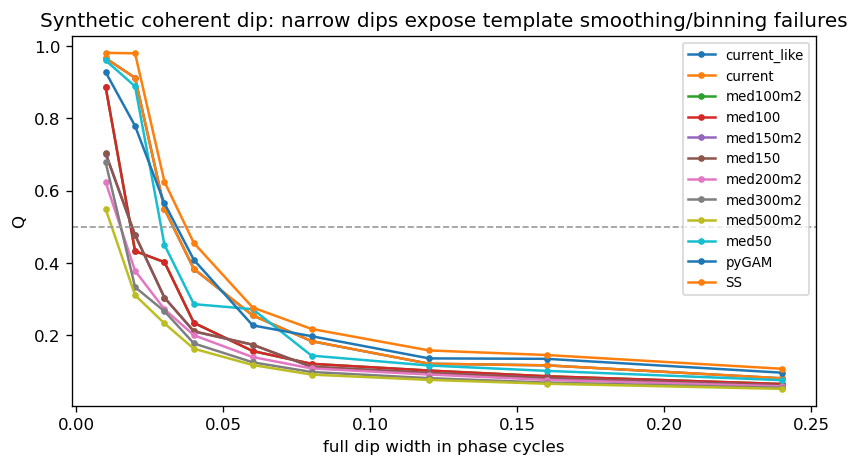

In [11]:
def make_synthetic_dipper(
    *,
    period: float = 2.98211,
    n_nights: int = 1200,
    baseline_days: float = 3200.0,
    dip_center: float = 0.22,
    dip_half_width: float = 0.02,
    dip_depth: float = 0.25,
    noise: float = 0.025,
    err: float = 0.02,
    seed: int = 42,
) -> dict:
    rng = np.random.default_rng(seed)
    # Nightly-ish cadence with seasonal-ish gaps: draw nights, jitter within a night.
    nights = np.sort(rng.choice(np.arange(int(baseline_days)), size=n_nights, replace=False))
    time = nights.astype(float) + rng.normal(0.0, 0.04, size=n_nights)
    phase = np.mod((time - time.min()) / period, 1.0)
    dist = np.abs(((phase - dip_center + 0.5) % 1.0) - 0.5)
    in_dip = dist < float(dip_half_width)
    values = rng.normal(0.0, noise, size=n_nights)
    values[in_dip] += dip_depth + rng.normal(0.0, noise, size=int(in_dip.sum()))
    errors = np.full(n_nights, err, dtype=float)
    return {"time": time, "values": values, "err": errors, "period": period, "phase": phase, "in_dip": in_dip}


def synthetic_width_sweep(
    widths=None,
    implementations=IMPLEMENTATIONS,
    seed: int = 42,
    include_pygam: bool = RUN_PYGAM,
    include_supersmoother: bool = RUN_SUPERSMOOTHER,
) -> pd.DataFrame:
    if widths is None:
        widths = np.array([0.005, 0.010, 0.015, 0.020, 0.030, 0.040, 0.060, 0.080, 0.120])
    rows = []
    for half_width in widths:
        data = make_synthetic_dipper(dip_half_width=float(half_width), seed=seed)
        table, _results = evaluate_templates(
            data["time"],
            data["values"],
            data["err"],
            data["period"],
            implementations,
            include_pygam=include_pygam,
            include_supersmoother=include_supersmoother,
        )
        table["dip_half_width"] = float(half_width)
        table["dip_full_width"] = float(2.0 * half_width)
        table["n_dip"] = int(data["in_dip"].sum())
        rows.append(table)
    return pd.concat(rows, ignore_index=True)


sweep = synthetic_width_sweep()
display(sweep.pivot_table(index="dip_full_width", columns="name", values="q"))
coverage_cols = ["dip_full_width", "n_dip", "name", "populated_bins", "bin_coverage", "status"]
focus_names = all_template_names(include_periodic_gp=False, include_external_gp=False)
display(sweep.loc[sweep["name"].isin(focus_names), coverage_cols])

fig, ax = plt.subplots(figsize=(8, 4))
for name, group in sweep.groupby("name"):
    if name in set(focus_names):
        ax.plot(group["dip_full_width"], group["q"], marker="o", markersize=3, label=short_template_name(name))
ax.axhline(0.5, color="0.6", lw=1, ls="--")
ax.set_xlabel("full dip width in phase cycles")
ax.set_ylabel("Q")
ax.set_title("Synthetic coherent dip: narrow dips expose template smoothing/binning failures")
ax.legend(fontsize=8)
plt.show()

## Single Candidate Deep Dive

Change `QUERY` to a candidate ID or ASAS-SN ID. Run once with `raw_q`, then with `review_resid` to see whether the input representation is part of the disagreement.

Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  2 to 2
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
candidate: stv_377957477426 ASAS-SN: 377957477426
mode: raw_q period: 1.9923569509095398 source: stats_variability_periodic_feature_period_days
stored DB Q: 0.9437388925621785
stored DB Q period: 1.9923569509095398 periodicity_period


,name,q,status,n_bins,smooth_window_bins,noise_subtract,populated_bins,bin_coverage,template_amplitude,raw_scatter,resid_scatter,scatter_ratio,min_bin_points,method,n_splines,spline_order,sigma_floor,lam,n_points,n_train,elapsed_s,fit_mode,period_fit,value_space,polyfit_degree,length_scale
11,supersmoother,0.756667,ok,NaN,NaN,False,NaN,NaN,0.042157,0.032473,0.028247,0.869866,NaN,gatspy_supersmoother,NaN,NaN,NaN,NaN,1466.0,1466.0,3.712058,narrow_period_search,1.992238,NaN,NaN,NaN
9,median500_min2_no_smooth_var,0.771454,ok,500.0,1.0,False,389.0,0.778000,0.175750,0.032473,0.028522,0.878325,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,median300_min2_no_smooth_var,0.829834,ok,300.0,1.0,False,282.0,0.940000,0.127500,0.032473,0.029581,0.910952,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,median200_min2_no_smooth_var,0.845555,ok,200.0,1.0,False,199.0,0.995000,0.116000,0.032473,0.029860,0.919540,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,periodic_gp,0.845752,ok,NaN,NaN,False,NaN,NaN,0.067107,0.032473,0.029864,0.919648,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,median150_no_smooth_var,0.882067,ok,150.0,1.0,False,148.0,0.986667,0.086000,0.032473,0.030498,0.939184,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,median150_min2_no_smooth_var,0.882067,ok,150.0,1.0,False,148.0,0.986667,0.086000,0.032473,0.030498,0.939184,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,median100_no_smooth_var,0.901558,ok,100.0,1.0,False,100.0,1.000000,0.056000,0.032473,0.030833,0.949504,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,median100_min2_no_smooth_var,0.901558,ok,100.0,1.0,False,100.0,1.000000,0.056000,0.032473,0.030833,0.949504,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,median50_no_smooth_var,0.933518,ok,50.0,1.0,False,50.0,1.000000,0.045000,0.032473,0.031375,0.966187,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


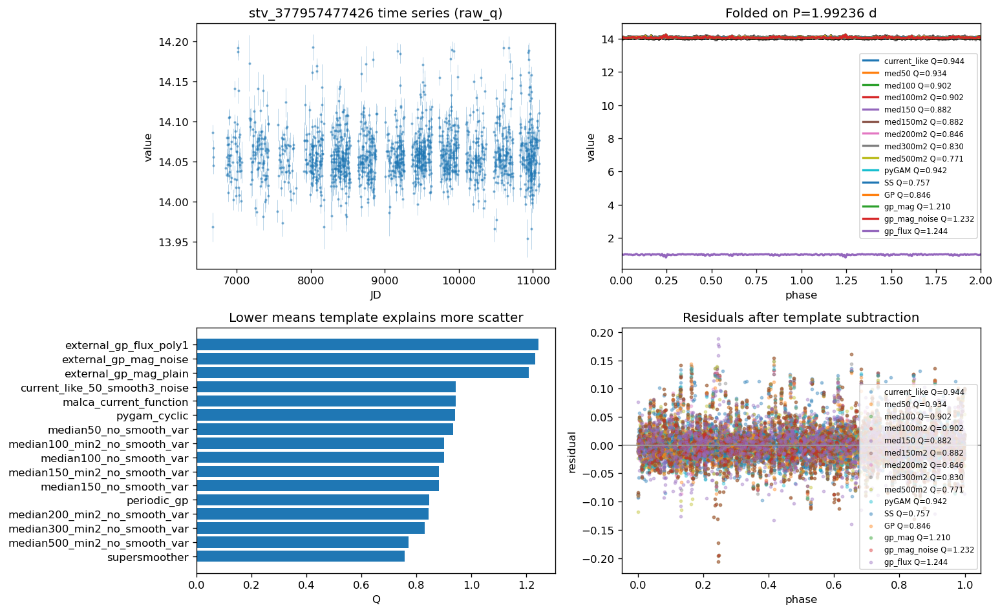

In [12]:
def phase_scatter(ax, phase, values, *, title="", color="k", s=8, alpha=0.45):
    ax.scatter(phase, values, s=s, alpha=alpha, color=color, linewidths=0)
    ax.scatter(phase + 1.0, values, s=s, alpha=alpha, color=color, linewidths=0)
    ax.set_xlim(0, 2)
    ax.set_xlabel("phase")
    ax.set_ylabel("value")
    ax.set_title(title)


def overlay_template(ax, result: dict, *, label: str | None = None, lw=2):
    centers = result.get("centers")
    template = result.get("template")
    if centers is None or template is None:
        return
    centers = np.asarray(centers, dtype=float)
    template = np.asarray(template, dtype=float)
    ok = np.isfinite(centers) & np.isfinite(template)
    if ok.sum() == 0:
        return
    c = centers[ok]
    t = template[ok]
    order = np.argsort(c)
    c = c[order]
    t = t[order]
    (line,) = ax.plot(c, t, lw=lw, label=label or result.get("name", "template"))
    ax.plot(c + 1.0, t, lw=lw, color=line.get_color())


def plot_residuals_for_result(ax, result: dict, *, label: str | None = None, s=6, alpha=0.35):
    phase = result.get("phase")
    resid = result.get("resid")
    if phase is None or resid is None:
        values = result.get("values")
        model = result.get("model")
        if phase is None or values is None or model is None:
            return
        phase = np.asarray(phase, dtype=float)
        values = np.asarray(values, dtype=float)
        model = np.asarray(model, dtype=float)
        ok = np.isfinite(phase) & np.isfinite(values) & np.isfinite(model)
        resid = values[ok] - model[ok]
        phase = phase[ok]
    else:
        phase = np.asarray(phase, dtype=float)
        resid = np.asarray(resid, dtype=float)
        n = min(phase.size, resid.size)
        phase = phase[:n]
        resid = resid[:n]
        ok = np.isfinite(phase) & np.isfinite(resid)
        phase = phase[ok]
        resid = resid[ok]
    if phase.size == 0:
        return
    ax.scatter(phase, resid, s=s, alpha=alpha, label=label or result.get("name", "template"))


def plot_candidate_q(
    query: str,
    *,
    mode: str = "raw_q",
    period_override: float | None = None,
    include_gp: bool = RUN_GP,
    include_pygam: bool = RUN_PYGAM,
    include_supersmoother: bool = RUN_SUPERSMOOTHER,
    include_external_gp: bool = True,
    external_gp_max_train: int | None = 500,
):
    row, arrays = load_candidate_arrays(query, mode=mode)
    period, period_source = (float(period_override), "manual_override") if period_override else period_from_row(row)
    time = arrays["time"]
    values = arrays["values"]
    err = arrays["err"]
    table, results = evaluate_templates(
        time,
        values,
        err,
        period,
        include_pygam=include_pygam,
        include_supersmoother=include_supersmoother,
    )
    if include_gp:
        gp_result = gp_phase_template_q(time, values, err, period)
        results["periodic_gp"] = gp_result
        table = pd.concat([
            table,
            pd.DataFrame([{
                "name": "periodic_gp",
                "q": gp_result.get("q"),
                "status": gp_result.get("status"),
                "n_bins": np.nan,
                "smooth_window_bins": np.nan,
                "noise_subtract": False,
                "populated_bins": np.nan,
                "bin_coverage": np.nan,
                "template_amplitude": gp_result.get("template_amplitude"),
                "raw_scatter": gp_result.get("raw_scatter"),
                "resid_scatter": gp_result.get("resid_scatter"),
                "scatter_ratio": gp_result.get("scatter_ratio"),
            }])
        ], ignore_index=True)
    if include_external_gp:
        external_rows, external_results = external_gp_rows_and_results(
            time,
            values,
            err,
            period,
            max_train=external_gp_max_train,
        )
        table = pd.concat([table, pd.DataFrame(external_rows)], ignore_index=True)
        results.update(external_results)

    print("candidate:", row.get("candidate_id"), "ASAS-SN:", row.get("asas_sn_id"))
    print("mode:", mode, "period:", period, "source:", period_source)
    print("stored DB Q:", row.get("stats_variability_quasi_periodicity_q"))
    print("stored DB Q period:", row.get("stats_variability_periodic_feature_period_days"), row.get("stats_variability_periodic_feature_period_source"))
    display(table.sort_values("q"))

    phase = np.mod((time - np.nanmin(time)) / period, 1.0)
    fig, axes = plt.subplots(2, 2, figsize=(13, 8))
    ax = axes[0, 0]
    ax.errorbar(time, values, yerr=err, fmt=".", ms=3, alpha=0.45, elinewidth=0.4)
    ax.set_xlabel("JD")
    ax.set_ylabel("value")
    ax.set_title(f"{row.get('candidate_id')} time series ({mode})")

    ax = axes[0, 1]
    phase_scatter(ax, phase, values, title=f"Folded on P={period:.6g} d")
    for key in result_plot_names(results, table, include_external_gp=include_external_gp):
        overlay_template(ax, results[key], label=q_label(key, table))
    ax.legend(fontsize=7)

    ax = axes[1, 0]
    plot_cols = table.dropna(subset=["q"]).sort_values("q")
    ax.barh(plot_cols["name"], plot_cols["q"])
    ax.set_xlabel("Q")
    ax.set_title("Lower means template explains more scatter")

    ax = axes[1, 1]
    for key in result_plot_names(results, table, include_external_gp=include_external_gp):
        plot_residuals_for_result(ax, results[key], label=q_label(key, table))
    ax.axhline(0, color="0.6", lw=1)
    ax.set_xlabel("phase")
    ax.set_ylabel("residual")
    ax.set_title("Residuals after template subtraction")
    ax.legend(fontsize=7)

    fig.tight_layout()
    plt.show()
    return row, arrays, table, results


QUERY = "stv_377957477426"  # try: stv_601295764298, 377957477426, or any ASAS-SN ID
row, arrays, table, results = plot_candidate_q(
    QUERY,
    mode="raw_q",
    include_gp=True,
    include_external_gp=True,
    include_supersmoother=RUN_SUPERSMOOTHER,
)


## Focused Bin-Count Comparison

This cell compares the current Q against the no-smoothing median-template variants. Use it to ask whether more bins are really helping, and check coverage at the same time.

,name,q,status,n_bins,min_bin_points,smooth_window_bins,noise_subtract,populated_bins,bin_coverage,template_amplitude,raw_scatter,resid_scatter,scatter_ratio
0,malca_current_function,0.943739,ok,50.0,NaN,3.0,True,50.0,1.000000,0.024833,0.032473,0.031673,0.975361
1,current_like_50_smooth3_noise,0.943739,ok,50.0,3.0,3.0,True,50.0,1.000000,0.024833,0.032473,0.031673,0.975361
2,median50_no_smooth_var,0.933518,ok,50.0,3.0,1.0,False,50.0,1.000000,0.045000,0.032473,0.031375,0.966187
3,median100_no_smooth_var,0.901558,ok,100.0,3.0,1.0,False,100.0,1.000000,0.056000,0.032473,0.030833,0.949504
4,median100_min2_no_smooth_var,0.901558,ok,100.0,2.0,1.0,False,100.0,1.000000,0.056000,0.032473,0.030833,0.949504
5,median150_no_smooth_var,0.882067,ok,150.0,3.0,1.0,False,148.0,0.986667,0.086000,0.032473,0.030498,0.939184
6,median150_min2_no_smooth_var,0.882067,ok,150.0,2.0,1.0,False,148.0,0.986667,0.086000,0.032473,0.030498,0.939184
7,median200_min2_no_smooth_var,0.845555,ok,200.0,2.0,1.0,False,199.0,0.995000,0.116000,0.032473,0.029860,0.919540
8,median300_min2_no_smooth_var,0.829834,ok,300.0,2.0,1.0,False,282.0,0.940000,0.127500,0.032473,0.029581,0.910952
9,median500_min2_no_smooth_var,0.771454,ok,500.0,2.0,1.0,False,389.0,0.778000,0.175750,0.032473,0.028522,0.878325


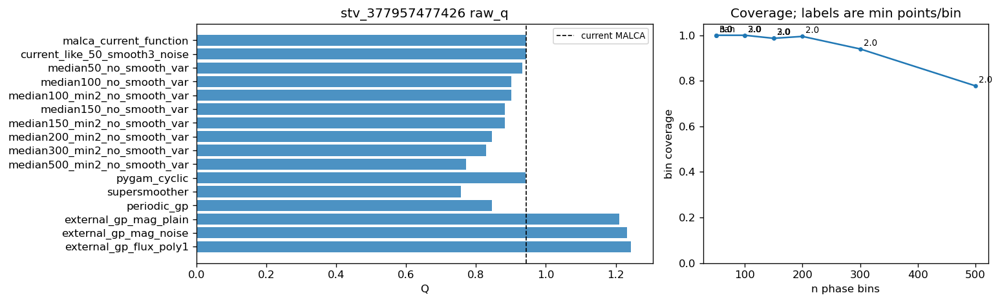

In [13]:
FOCUS_Q_NAMES = all_template_names(include_external_gp=True)


def plot_focused_q_comparison(table: pd.DataFrame, *, title: str = "Focused Q comparison") -> pd.DataFrame:
    focus = table[table["name"].isin(FOCUS_Q_NAMES)].copy()
    focus["name"] = pd.Categorical(focus["name"], categories=FOCUS_Q_NAMES, ordered=True)
    focus = focus.sort_values("name")
    display_cols = [
        "name",
        "q",
        "status",
        "n_bins",
        "min_bin_points",
        "smooth_window_bins",
        "noise_subtract",
        "populated_bins",
        "bin_coverage",
        "template_amplitude",
        "raw_scatter",
        "resid_scatter",
        "scatter_ratio",
    ]
    display(focus[[c for c in display_cols if c in focus.columns]])

    fig, axes = plt.subplots(1, 2, figsize=(13, 4), gridspec_kw={"width_ratios": [1.6, 1.0]})
    ok_q = focus.dropna(subset=["q"])
    axes[0].barh(ok_q["name"].astype(str), ok_q["q"], color="tab:blue", alpha=0.8)
    axes[0].axvline(float(ok_q.loc[ok_q["name"] == "malca_current_function", "q"].iloc[0]) if (ok_q["name"] == "malca_current_function").any() else np.nan, color="k", ls="--", lw=1, label="current MALCA")
    axes[0].set_xlabel("Q")
    axes[0].set_title(title)
    axes[0].invert_yaxis()
    axes[0].legend(fontsize=8)

    coverage = focus.dropna(subset=["bin_coverage"])
    axes[1].plot(coverage["n_bins"], coverage["bin_coverage"], marker="o", markersize=3)
    for _, item in coverage.iterrows():
        axes[1].annotate(str(item["min_bin_points"]), (item["n_bins"], item["bin_coverage"]), textcoords="offset points", xytext=(3, 3), fontsize=8)
    axes[1].set_xlabel("n phase bins")
    axes[1].set_ylabel("bin coverage")
    axes[1].set_title("Coverage; labels are min points/bin")
    axes[1].set_ylim(0, 1.05)
    fig.tight_layout()
    plt.show()
    return focus


focus_raw = plot_focused_q_comparison(table, title=f"{row.get('candidate_id')} raw_q")

Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  2 to 2
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
candidate: stv_377957477426 ASAS-SN: 377957477426
mode: review_resid period: 1.9923569509095398 source: stats_variability_periodic_feature_period_days
stored DB Q: 0.9437388925621785
stored DB Q period: 1.9923569509095398 periodicity_period


,name,q,status,n_bins,smooth_window_bins,noise_subtract,populated_bins,bin_coverage,template_amplitude,raw_scatter,resid_scatter,scatter_ratio,min_bin_points,method,n_splines,spline_order,sigma_floor,lam,n_points,n_train,elapsed_s,fit_mode,period_fit,value_space,polyfit_degree,length_scale
11,supersmoother,0.706941,ok,NaN,NaN,False,NaN,NaN,0.041729,0.028871,0.024275,0.840798,NaN,gatspy_supersmoother,NaN,NaN,NaN,NaN,1107.0,1107.0,2.648787,narrow_period_search,1.992239,NaN,NaN,NaN
9,median500_min2_no_smooth_var,0.713430,ok,500.0,1.0,False,325.0,0.65,0.135564,0.028871,0.024386,0.844648,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,median300_min2_no_smooth_var,0.772400,ok,300.0,1.0,False,264.0,0.88,0.117768,0.028871,0.025374,0.878863,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,median200_min2_no_smooth_var,0.814164,ok,200.0,1.0,False,194.0,0.97,0.120633,0.028871,0.026051,0.902310,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,median150_min2_no_smooth_var,0.838847,ok,150.0,1.0,False,150.0,1.00,0.109393,0.028871,0.026443,0.915886,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,median150_no_smooth_var,0.842511,ok,150.0,1.0,False,147.0,0.98,0.072645,0.028871,0.026501,0.917884,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,median100_no_smooth_var,0.879642,ok,100.0,1.0,False,100.0,1.00,0.055644,0.028871,0.027078,0.937892,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,median100_min2_no_smooth_var,0.879642,ok,100.0,1.0,False,100.0,1.00,0.055644,0.028871,0.027078,0.937892,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,median50_no_smooth_var,0.921235,ok,50.0,1.0,False,50.0,1.00,0.035997,0.028871,0.027711,0.959810,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,pygam_cyclic,0.924396,ok,NaN,NaN,False,NaN,NaN,0.024780,0.028871,0.027759,0.961455,NaN,pygam_cyclic_pspline,30.0,3.0,0.02,10000.0,1107.0,1107.0,0.226647,NaN,NaN,NaN,NaN,NaN


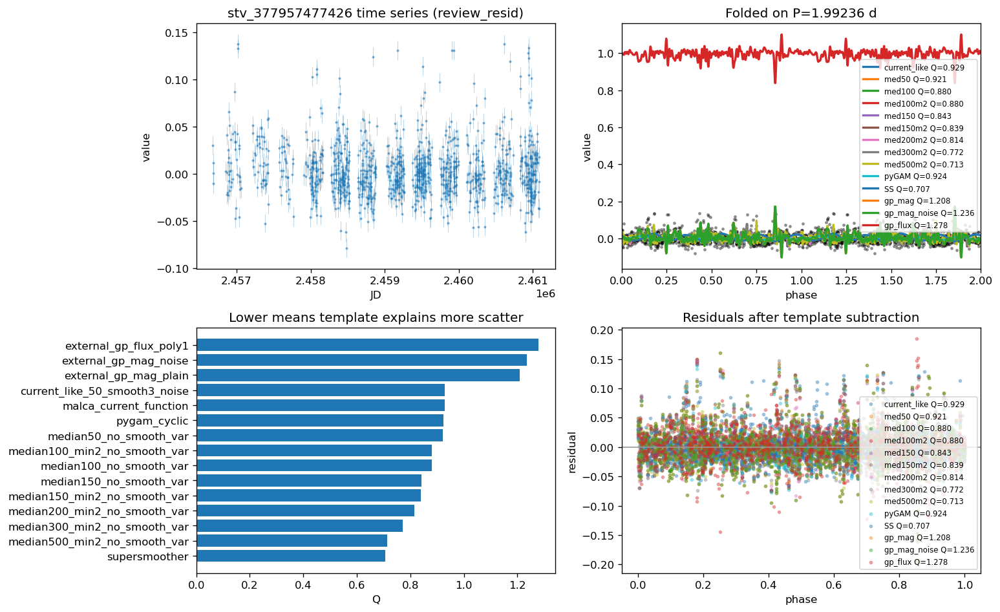

,name,q,status,n_bins,min_bin_points,smooth_window_bins,noise_subtract,populated_bins,bin_coverage,template_amplitude,raw_scatter,resid_scatter,scatter_ratio
0,malca_current_function,0.928903,ok,50.0,NaN,3.0,True,50.0,1.00,0.025622,0.028871,0.027954,0.968211
1,current_like_50_smooth3_noise,0.928903,ok,50.0,3.0,3.0,True,50.0,1.00,0.025622,0.028871,0.027954,0.968211
2,median50_no_smooth_var,0.921235,ok,50.0,3.0,1.0,False,50.0,1.00,0.035997,0.028871,0.027711,0.959810
3,median100_no_smooth_var,0.879642,ok,100.0,3.0,1.0,False,100.0,1.00,0.055644,0.028871,0.027078,0.937892
4,median100_min2_no_smooth_var,0.879642,ok,100.0,2.0,1.0,False,100.0,1.00,0.055644,0.028871,0.027078,0.937892
5,median150_no_smooth_var,0.842511,ok,150.0,3.0,1.0,False,147.0,0.98,0.072645,0.028871,0.026501,0.917884
6,median150_min2_no_smooth_var,0.838847,ok,150.0,2.0,1.0,False,150.0,1.00,0.109393,0.028871,0.026443,0.915886
7,median200_min2_no_smooth_var,0.814164,ok,200.0,2.0,1.0,False,194.0,0.97,0.120633,0.028871,0.026051,0.902310
8,median300_min2_no_smooth_var,0.772400,ok,300.0,2.0,1.0,False,264.0,0.88,0.117768,0.028871,0.025374,0.878863
9,median500_min2_no_smooth_var,0.713430,ok,500.0,2.0,1.0,False,325.0,0.65,0.135564,0.028871,0.024386,0.844648


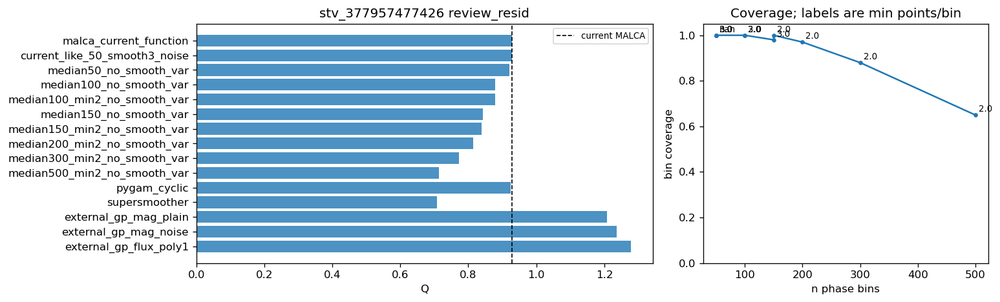

In [14]:
# Same candidate, but on the review plot / Find Period residual representation.
# This helps test whether Q disagrees because it is using a different light-curve representation.
row_resid, arrays_resid, table_resid, results_resid = plot_candidate_q(QUERY, mode="review_resid", include_gp=False)
focus_resid = plot_focused_q_comparison(table_resid, title=f"{row_resid.get('candidate_id')} review_resid")

## Period Sensitivity

If the period used by Q is not the period your eye is judging in review, the score is answering a different question. Use this cell to compare nearby aliases/manual periods.

Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  0.5 to 0.5
 - Computing periods at 10 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  0.66 to 0.66
 - Computing periods at 8 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  1 to 1
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  2 to 2
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 

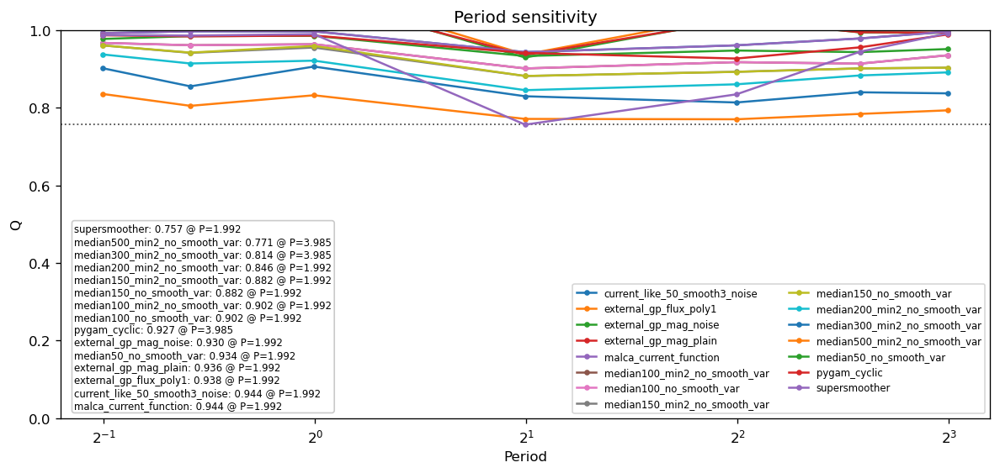

,name,q_min,period_at_q_min
0,supersmoother,0.756667,1.992357
1,median500_min2_no_smooth_var,0.770524,3.984714
2,median300_min2_no_smooth_var,0.813811,3.984714
3,median200_min2_no_smooth_var,0.845555,1.992357
4,median150_min2_no_smooth_var,0.882067,1.992357
5,median150_no_smooth_var,0.882067,1.992357
6,median100_min2_no_smooth_var,0.901558,1.992357
7,median100_no_smooth_var,0.901558,1.992357
8,pygam_cyclic,0.927089,3.984714
9,external_gp_mag_noise,0.929686,1.992357


name,current_like_50_smooth3_noise,external_gp_flux_poly1,external_gp_mag_noise,external_gp_mag_plain,malca_current_function,median100_min2_no_smooth_var,median100_no_smooth_var,median150_min2_no_smooth_var,median150_no_smooth_var,median200_min2_no_smooth_var,median300_min2_no_smooth_var,median500_min2_no_smooth_var,median50_no_smooth_var,pygam_cyclic,supersmoother
period_ratio_to_base,,,,,,,,,,,,,,,
0.250000,0.992427,1.139046,1.122310,1.110712,0.992427,0.967379,0.967379,0.960915,0.960915,0.937646,0.902106,0.835796,0.977557,0.986948,0.987857
0.333333,0.997329,1.008599,1.001068,1.000967,0.997329,0.961410,0.961410,0.941744,0.942355,0.914323,0.855398,0.805162,0.984873,0.984201,0.986294
0.500000,0.997077,1.100960,1.086355,1.078166,0.997077,0.963930,0.963930,0.955482,0.959549,0.921625,0.906381,0.832413,0.985753,0.986298,0.989939
1.000000,0.943739,0.937772,0.929686,0.936354,0.943739,0.901558,0.901558,0.882067,0.882067,0.845555,0.829834,0.771454,0.933518,0.941622,0.756667
2.000000,0.961114,1.039211,1.028559,1.025851,0.961114,0.917805,0.917805,0.892908,0.892792,0.860642,0.813811,0.770524,0.947714,0.927089,0.834804
3.000000,0.978854,1.001366,0.994410,0.994940,0.978854,0.913901,0.913901,0.901670,0.901670,0.883457,0.840108,0.784353,0.943652,0.955951,0.944641
4.000000,0.996429,1.004702,0.993107,0.993761,0.996429,0.935485,0.935485,0.903511,0.903511,0.891367,0.837335,0.793553,0.951520,0.989173,0.991838


In [15]:
PERIOD_SENSITIVITY_Q_NAMES = all_template_names(include_periodic_gp=False, include_external_gp=False)

PERIOD_SENSITIVITY_RATIOS = [1 / 4, 1 / 3, 1 / 2, 1.0, 2.0, 3.0, 4.0]


PERIOD_SENSITIVITY_SHORT_NAMES = dict(TEMPLATE_SHORT_NAMES)


def period_sensitivity_table(
    query: str,
    periods: list[float] | None = None,
    *,
    mode: str = "raw_q",
    include_external_gp: bool = False,
    external_gp_max_train: int = 900,
    include_pygam: bool = RUN_PYGAM,
    pygam_max_train: int | None = None,
    include_supersmoother: bool = RUN_SUPERSMOOTHER,
    supersmoother_max_train: int | None = 2000,
    ratios: list[float] | None = None,
) -> tuple[pd.DataFrame, pd.Series, float, str]:
    row, arrays = load_candidate_arrays(query, mode=mode)
    base_period, source = period_from_row(row)
    if periods is None:
        ratios = PERIOD_SENSITIVITY_RATIOS if ratios is None else ratios
        periods = [base_period * ratio for ratio in ratios]
    rows = []
    for period in periods:
        table, _ = evaluate_templates(
            arrays["time"],
            arrays["values"],
            arrays["err"],
            period,
            include_pygam=include_pygam,
            pygam_max_train=pygam_max_train,
            include_supersmoother=include_supersmoother,
            supersmoother_max_train=supersmoother_max_train,
        )
        keep = table[table["name"].isin(PERIOD_SENSITIVITY_Q_NAMES)]
        for _, item in keep.iterrows():
            rows.append({"period": period, "period_ratio_to_base": period / base_period, **item.to_dict()})
        if include_external_gp:
            external_rows, _external_results = external_gp_rows_and_results(
                arrays["time"],
                arrays["values"],
                arrays["err"],
                period,
                max_train=external_gp_max_train,
            )
            for item in external_rows:
                rows.append({
                    "period": period,
                    "period_ratio_to_base": period / base_period,
                    **item,
                })
    return pd.DataFrame(rows), row, base_period, source


def period_sensitivity_minima(out: pd.DataFrame) -> pd.DataFrame:
    sub = out.replace([np.inf, -np.inf], np.nan).dropna(subset=["name", "period", "q"]).copy()
    if sub.empty:
        return pd.DataFrame(columns=["name", "q_min", "period_at_q_min"])
    idx = sub.groupby("name")["q"].idxmin()
    minima = sub.loc[idx, ["name", "q", "period"]].rename(columns={"q": "q_min", "period": "period_at_q_min"})
    return minima.sort_values("q_min").reset_index(drop=True)


def format_period_sensitivity_minima(
    out: pd.DataFrame,
    *,
    short_names: bool = False,
    max_rows: int | None = None,
) -> str:
    minima = period_sensitivity_minima(out)
    if max_rows is not None:
        minima = minima.head(max_rows)
    lines = []
    for _, row in minima.iterrows():
        name = str(row["name"])
        if short_names:
            name = PERIOD_SENSITIVITY_SHORT_NAMES.get(name, name)
        lines.append(f"{name}: {row['q_min']:.3f} @ P={row['period_at_q_min']:.4g}")
    return "\n".join(lines)


def plot_period_sensitivity_table(
    out: pd.DataFrame,
    *,
    ax: plt.Axes | None = None,
    title: str = "Period sensitivity",
    legend: bool = True,
    show: bool = True,
    q_ylim: tuple[float, float] | None = (0.0, 1.0),
    show_global_min_line: bool = True,
    show_minima: bool = True,
    minima_short_names: bool = False,
    minima_max_rows: int | None = None,
    minima_fontsize: float = 7.0,
) -> plt.Axes:
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 4.8))
    else:
        fig = ax.figure
    for name, group in out.groupby("name"):
        group = group.sort_values("period")
        ax.plot(group["period"], group["q"], marker="o", markersize=3, label=name)
    q_series = out["q"] if "q" in out.columns else pd.Series(dtype=float)
    q_values = pd.to_numeric(q_series, errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    if show_global_min_line and len(q_values):
        q_min = float(q_values.min())
        ax.axhline(q_min, color="0.2", linestyle=":", linewidth=1.1, alpha=0.85, zorder=0)
    ax.set_xscale("log", base=2)
    ax.set_xlabel("Period")
    ax.set_ylabel("Q")
    ax.set_title(title)
    if q_ylim is not None:
        ax.set_ylim(*q_ylim)
    if show_minima:
        minima_text = format_period_sensitivity_minima(out, short_names=minima_short_names, max_rows=minima_max_rows)
        if minima_text:
            ax.text(
                0.015,
                0.02,
                minima_text,
                transform=ax.transAxes,
                ha="left",
                va="bottom",
                fontsize=minima_fontsize,
                bbox=dict(facecolor="white", edgecolor="0.75", alpha=0.82, boxstyle="round,pad=0.25"),
            )
    missing = []
    for name in table_template_names(out, include_external_gp=True):
        group = out.loc[out["name"] == name]
        if not group.empty and not np.isfinite(pd.to_numeric(group["q"], errors="coerce")).any():
            statuses = [str(x) for x in group.get("status", pd.Series(dtype=object)).dropna().unique()]
            status = statuses[0].split(":", 1)[0] if statuses else "no finite Q"
            missing.append(f"{short_template_name(name)}: {status}")
    if missing:
        ax.text(
            0.985,
            0.02,
            "\n".join(missing),
            transform=ax.transAxes,
            ha="right",
            va="bottom",
            fontsize=max(5.0, minima_fontsize - 0.5),
            bbox=dict(facecolor="white", edgecolor="0.85", alpha=0.74, boxstyle="round,pad=0.22"),
        )
    if legend:
        ax.legend(fontsize=7, ncols=2)
    if show:
        fig.tight_layout()
        plt.show()
    return ax


def period_sensitivity(
    query: str,
    periods: list[float] | None = None,
    *,
    mode: str = "raw_q",
    include_external_gp: bool = False,
    external_gp_max_train: int = 900,
    include_pygam: bool = RUN_PYGAM,
    pygam_max_train: int | None = None,
    include_supersmoother: bool = RUN_SUPERSMOOTHER,
    supersmoother_max_train: int | None = 2000,
    ratios: list[float] | None = None,
) -> pd.DataFrame:
    out, row, _base_period, _source = period_sensitivity_table(
        query,
        periods=periods,
        mode=mode,
        include_external_gp=include_external_gp,
        external_gp_max_train=external_gp_max_train,
        include_pygam=include_pygam,
        pygam_max_train=pygam_max_train,
        include_supersmoother=include_supersmoother,
        supersmoother_max_train=supersmoother_max_train,
        ratios=ratios,
    )
    fig, ax = plt.subplots(figsize=(10, 4.8))
    plot_period_sensitivity_table(out, ax=ax, title="Period sensitivity", legend=True, show=False)
    fig.tight_layout()
    plt.show()
    return out

period_scan = period_sensitivity(QUERY, mode="raw_q", include_external_gp=True, external_gp_max_train=700)
display(period_sensitivity_minima(period_scan))
display(period_scan.pivot_table(index="period_ratio_to_base", columns="name", values="q"))

## Review-Residual Period Sensitivity With Attached-Style GP Q

The raw-Q period-sensitivity plot above now includes every implementation on one axis. This companion cell does the same all-in-one comparison on the review/residual light-curve representation.

Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  0.5 to 0.5
 - Computing periods at 10 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  0.66 to 0.66
 - Computing periods at 8 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  1 to 1
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000285
 - User-specified period range:  2 to 2
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 

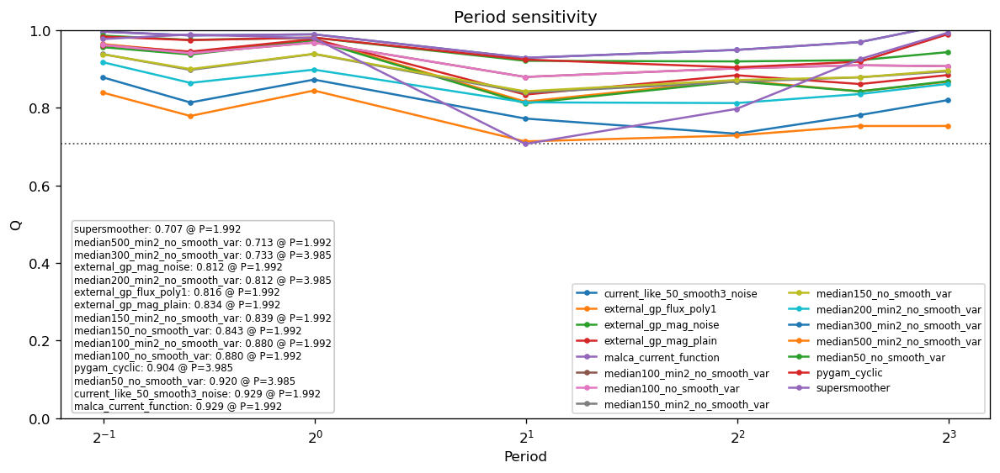

,name,q_min,period_at_q_min
0,supersmoother,0.706941,1.992357
1,median500_min2_no_smooth_var,0.713430,1.992357
2,median300_min2_no_smooth_var,0.733307,3.984714
3,external_gp_mag_noise,0.811587,1.992357
4,median200_min2_no_smooth_var,0.812224,3.984714
5,external_gp_flux_poly1,0.816063,1.992357
6,external_gp_mag_plain,0.834191,1.992357
7,median150_min2_no_smooth_var,0.838847,1.992357
8,median150_no_smooth_var,0.842511,1.992357
9,median100_min2_no_smooth_var,0.879642,1.992357


name,current_like_50_smooth3_noise,external_gp_flux_poly1,external_gp_mag_noise,external_gp_mag_plain,malca_current_function,median100_min2_no_smooth_var,median100_no_smooth_var,median150_min2_no_smooth_var,median150_no_smooth_var,median200_min2_no_smooth_var,median300_min2_no_smooth_var,median500_min2_no_smooth_var,median50_no_smooth_var,pygam_cyclic,supersmoother
period_ratio_to_base,,,,,,,,,,,,,,,
0.250000,0.996472,0.964384,0.956413,0.961642,0.996472,0.962256,0.962256,0.938441,0.938157,0.917610,0.878654,0.839320,0.986091,0.983561,0.977321
0.333333,0.986653,0.943430,0.937407,0.944916,0.986653,0.940682,0.940682,0.897705,0.899908,0.864374,0.813859,0.779036,0.975128,0.974568,0.988908
0.500000,0.989423,0.975834,0.974187,0.977283,0.989423,0.968353,0.968353,0.938780,0.939276,0.898439,0.872768,0.844555,0.980750,0.981115,0.979614
1.000000,0.928903,0.816063,0.811587,0.834191,0.928903,0.879642,0.879642,0.838847,0.842511,0.814164,0.772400,0.713430,0.921235,0.924396,0.706941
2.000000,0.949335,0.871199,0.868227,0.884036,0.949335,0.901795,0.901795,0.867105,0.871677,0.812224,0.733307,0.728807,0.919654,0.904287,0.797236
3.000000,0.969511,0.842544,0.842446,0.861347,0.969511,0.909752,0.909752,0.878777,0.878777,0.835597,0.781476,0.753157,0.922891,0.918907,0.925574
4.000000,1.015188,0.867211,0.868667,0.884422,1.015188,0.907413,0.907413,0.893837,0.896506,0.861726,0.819795,0.753271,0.943533,0.989519,0.993478


In [16]:
period_scan_gp_resid = period_sensitivity(QUERY, mode="review_resid", include_external_gp=True, external_gp_max_train=700)
display(period_sensitivity_minima(period_scan_gp_resid))
display(period_scan_gp_resid.pivot_table(index="period_ratio_to_base", columns="name", values="q"))

## Sample-Level Comparison

This still does not recompute the full 22k set by default, but it now samples hundreds of candidates instead of a tiny sanity-check set. The sample mixes low-Q, high-Q, a grid across the Q distribution, and random candidates so the gallery below has enough light curves to make failure modes obvious.

candidate sample: 475 light curves


,bucket,n
0,q_distribution_grid,158
1,random_seed_123,157
2,lowest_current_q,80
3,highest_current_q,80


recomputing 1/475: stv_197569005336
Finding optimal frequency:
 - Estimated peak width = 0.00156
 - Using 5 steps per peak; omega_step = 0.000312
 - User-specified period range:  2.5 to 2.5
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00156
 - Using 5 steps per peak; omega_step = 0.000311
 - User-specified period range:  1.5 to 1.5
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.0017
 - Using 5 steps per peak; omega_step = 0.000341
 - User-specified period range:  3 to 3
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  1.9 to 1.9
 - Computing periods at 4 steps
Zooming-in on 5 candida

,candidate_id,asas_sn_id,stored_q,period,period_source,mode,current_like_50_smooth3_noise,malca_current_function,median100_min2_no_smooth_var,median100_no_smooth_var,median150_min2_no_smooth_var,median150_no_smooth_var,median200_min2_no_smooth_var,median300_min2_no_smooth_var,median500_min2_no_smooth_var,median50_no_smooth_var,pygam_cyclic,supersmoother,delta_current_minus_100bin,delta_current_minus_50bin
0,stv_103080056311,103080056311,0.991763,29.554455,stats_variability_periodic_feature_period_days,raw_q,0.991763,0.991763,0.983151,0.983151,0.965701,0.965701,0.950356,0.915223,0.855482,0.989121,0.990359,0.988276,0.008612,0.002642
1,stv_103080120065,103080120065,0.993077,1.619649,stats_variability_periodic_feature_period_days,raw_q,0.993077,0.993077,0.924226,0.924226,0.879387,0.881481,0.807010,0.784683,0.746301,0.980997,0.918034,0.995202,0.068852,0.012080
2,stv_103080363125,103080363125,1.010464,1.941741,stats_variability_periodic_feature_period_days,raw_q,1.010464,1.010464,0.982375,0.998589,0.930239,0.954141,0.848926,0.821325,0.806384,1.005045,0.966391,0.977423,0.011876,0.005420
3,stv_111669211404,111669211404,0.065770,2.953422,stats_variability_periodic_feature_period_days,raw_q,0.065770,0.065770,0.077796,0.077872,0.076533,0.079785,0.075889,0.072775,0.073517,0.080484,0.080404,0.117770,-0.012102,-0.014714
4,stv_111669273145,111669273145,0.817209,1.993938,stats_variability_periodic_feature_period_days,raw_q,0.817209,0.817209,0.820228,0.820228,0.809408,0.809408,0.788331,0.742948,0.694601,0.833106,0.823455,0.799539,-0.003018,-0.015896
5,stv_111669492298,111669492298,1.011304,1.147559,stats_variability_periodic_feature_period_days,raw_q,1.011304,1.011304,0.992781,0.992781,0.915563,0.915563,0.868369,0.795705,0.762517,1.078369,0.954175,0.959748,0.018523,-0.067065
6,stv_111669493585,111669493585,1.006521,1.752999,stats_variability_periodic_feature_period_days,raw_q,1.006521,1.006521,0.965538,0.965538,0.920594,0.928157,0.884251,0.847648,0.806045,0.989265,0.995241,0.994926,0.040983,0.017256
7,stv_111669909019,111669909019,0.057321,2.520873,stats_variability_periodic_feature_period_days,raw_q,0.057321,0.057321,0.058090,0.058085,0.054638,0.055062,0.052869,0.049798,0.049254,0.061607,0.058047,0.074278,-0.000764,-0.004286
8,stv_111670109164,111670109164,0.976704,3.131785,stats_variability_periodic_feature_period_days,raw_q,0.976704,0.976704,0.924355,0.937073,0.885841,0.903896,0.909485,0.882051,0.859191,0.969085,0.964369,0.986417,0.039632,0.007619
9,stv_111670390701,111670390701,0.722111,1.419171,stats_variability_periodic_feature_period_days,raw_q,0.722111,0.722111,0.750466,0.752550,0.742040,0.741678,0.730126,0.705114,0.670230,0.764598,0.755539,0.810292,-0.030438,-0.042486


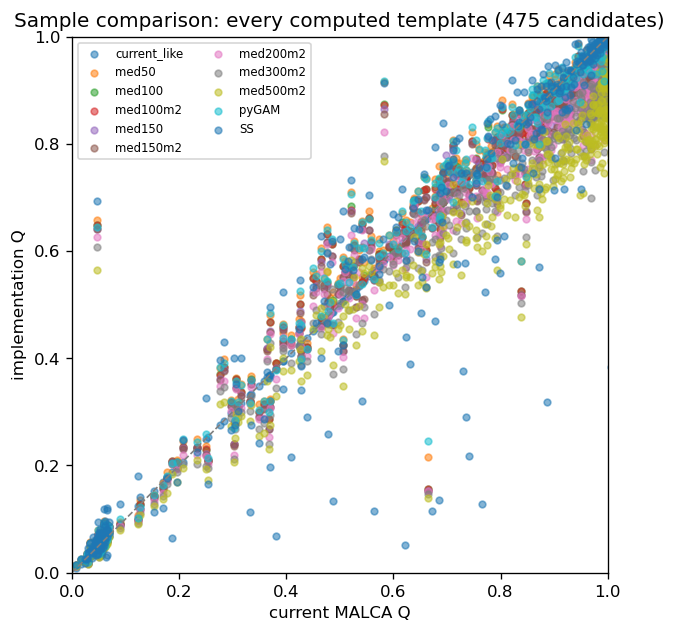

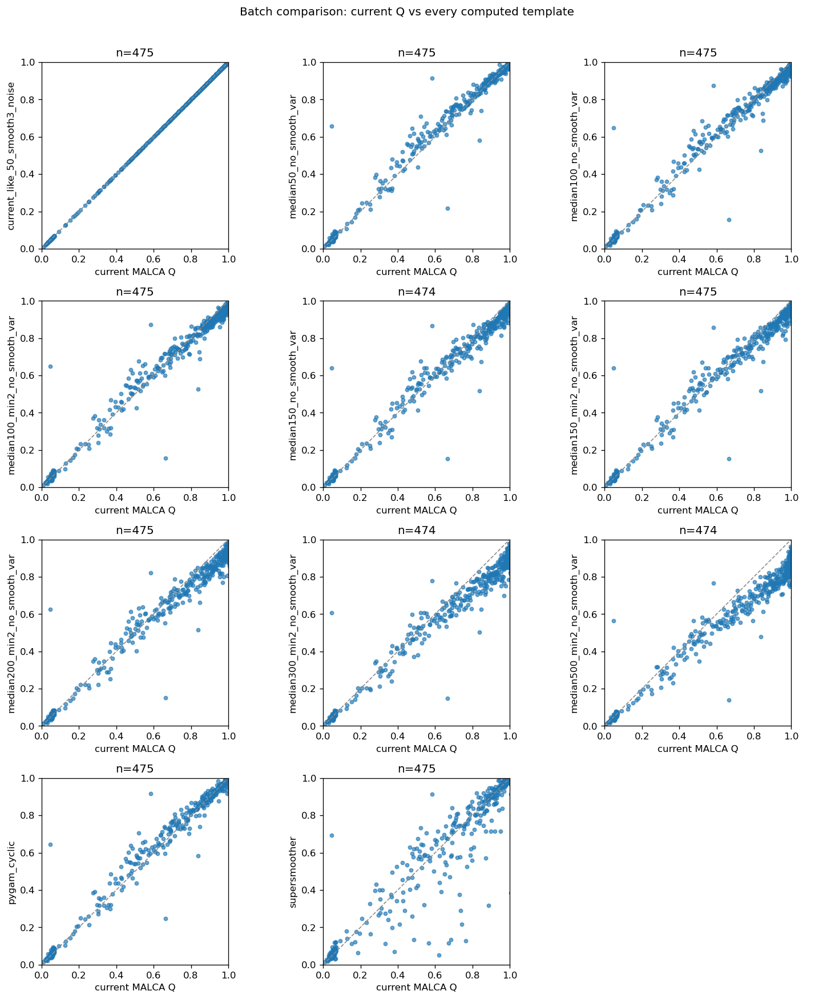

In [17]:
def _with_bucket(df: pd.DataFrame, bucket: str) -> pd.DataFrame:
    out = df.copy()
    out["bucket"] = bucket
    return out


def candidate_sample(
    *,
    n_extreme: int = 80,
    n_quantile: int = 160,
    n_random: int = 160,
    seed: int = 123,
) -> pd.DataFrame:
    with sqlite3.connect(DB_PATH) as conn:
        df = pd.read_sql_query(
            """
            SELECT candidate_id, asas_sn_id, stats_variability_quasi_periodicity_q AS q
            FROM candidates
            WHERE stats_variability_quasi_periodicity_q IS NOT NULL
            """,
            conn,
        )
    df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=["q"]).reset_index(drop=True)
    q_sorted = df.sort_values("q").reset_index(drop=True)
    parts = [
        _with_bucket(q_sorted.head(n_extreme), "lowest_current_q"),
        _with_bucket(q_sorted.tail(n_extreme).iloc[::-1], "highest_current_q"),
    ]
    if n_quantile > 0 and len(q_sorted):
        q_idx = np.unique(np.linspace(0, len(q_sorted) - 1, min(n_quantile, len(q_sorted))).round().astype(int))
        parts.append(_with_bucket(q_sorted.iloc[q_idx], "q_distribution_grid"))
    if n_random > 0 and len(df):
        parts.append(_with_bucket(df.sample(min(n_random, len(df)), random_state=seed), "random_seed_123"))
    out = pd.concat(parts, ignore_index=True)
    out = out.drop_duplicates("candidate_id", keep="first").reset_index(drop=True)
    return out[["bucket", "candidate_id", "asas_sn_id", "q"]]


def recompute_sample(ids: list[str], *, mode: str = "raw_q") -> pd.DataFrame:
    rows = []
    for i, cid in enumerate(ids, start=1):
        if i == 1 or i % 50 == 0 or i == len(ids):
            print(f"recomputing {i}/{len(ids)}: {cid}")
        try:
            row, arrays = load_candidate_arrays(cid, mode=mode)
            period, source = period_from_row(row)
            table, _ = evaluate_templates(
                arrays["time"],
                arrays["values"],
                arrays["err"],
                period,
                include_pygam=RUN_PYGAM,
                include_supersmoother=RUN_SUPERSMOOTHER,
            )
            keep = table[table["name"].isin(FOCUS_Q_NAMES)]
            for _, item in keep.iterrows():
                rows.append({
                    "candidate_id": row.get("candidate_id"),
                    "asas_sn_id": row.get("asas_sn_id"),
                    "stored_q": row.get("stats_variability_quasi_periodicity_q"),
                    "period": period,
                    "period_source": source,
                    "mode": mode,
                    **item.to_dict(),
                })
        except Exception as exc:
            rows.append({"candidate_id": cid, "mode": mode, "name": "error", "status": str(exc), "q": np.nan})
    return pd.DataFrame(rows)


def sample_wide_table(sample_results: pd.DataFrame) -> pd.DataFrame:
    wide = sample_results.pivot_table(
        index=["candidate_id", "asas_sn_id", "stored_q", "period", "period_source", "mode"],
        columns="name",
        values="q",
        aggfunc="first",
    ).reset_index()
    wide.columns.name = None
    if {"malca_current_function", "median100_no_smooth_var"}.issubset(wide.columns):
        wide["delta_current_minus_100bin"] = wide["malca_current_function"] - wide["median100_no_smooth_var"]
    if {"malca_current_function", "median50_no_smooth_var"}.issubset(wide.columns):
        wide["delta_current_minus_50bin"] = wide["malca_current_function"] - wide["median50_no_smooth_var"]
    return wide


SAMPLE_META = candidate_sample(n_extreme=80, n_quantile=160, n_random=160)
SAMPLE_IDS = SAMPLE_META["candidate_id"].tolist()
print(f"candidate sample: {len(SAMPLE_IDS)} light curves")
display(SAMPLE_META["bucket"].value_counts().rename_axis("bucket").reset_index(name="n"))
sample_raw = recompute_sample(SAMPLE_IDS, mode="raw_q")
sample_wide = sample_wide_table(sample_raw)
display(sample_wide.head(25))

comparison_cols = [
    col
    for col in all_template_names(include_current=False, include_external_gp=False)
    if col in sample_wide.columns
]

fig, ax = plt.subplots(figsize=(6.8, 5.8))
wide = sample_wide.dropna(subset=["malca_current_function"])
for col in comparison_cols:
    sub = wide.dropna(subset=[col])
    if sub.empty:
        continue
    ax.scatter(sub["malca_current_function"], sub[col], alpha=0.55, s=16, label=short_template_name(col))
ax.plot([0, 1], [0, 1], color="0.5", ls="--", lw=1)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel("current MALCA Q")
ax.set_ylabel("implementation Q")
ax.set_title(f"Sample comparison: every computed template ({len(wide)} candidates)")
ax.legend(fontsize=7, ncol=2)
plt.show()
ncols = 3
nrows = int(math.ceil(len(comparison_cols) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 3.6 * nrows), squeeze=False)
for ax, col in zip(axes.ravel(), comparison_cols):
    sub = sample_wide.dropna(subset=["malca_current_function", col])
    ax.scatter(sub["malca_current_function"], sub[col], s=14, alpha=0.65)
    ax.plot([0, 1], [0, 1], color="0.55", ls="--", lw=1)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel("current MALCA Q")
    ax.set_ylabel(col)
    ax.set_title(f"n={len(sub)}")
for ax in axes.ravel()[len(comparison_cols):]:
    ax.set_axis_off()
fig.suptitle("Batch comparison: current Q vs every computed template", y=1.01)
fig.tight_layout()
plt.show()

## Many-Candidate Period-Sensitivity Gallery

This is the batch version of the Q-vs-period plot. It makes pages of candidates so the failure modes are visible across the sample, not just one hand-picked light curve.

period-sensitivity candidates: 262


,bucket,candidate_id,asas_sn_id,stored_q,malca_current_function,current_like_50_smooth3_noise,median50_no_smooth_var,median100_no_smooth_var,median100_min2_no_smooth_var,median150_no_smooth_var,median150_min2_no_smooth_var,median200_min2_no_smooth_var,median300_min2_no_smooth_var,median500_min2_no_smooth_var,pygam_cyclic,supersmoother,delta_current_minus_alt
0,current_high_alt_low,stv_68719569800,68719569800,1.094913,1.094913,1.094913,0.838168,0.234742,0.234742,0.173298,0.173030,0.147543,0.133017,0.126159,0.983514,0.988684,0.921615
1,current_high_alt_low,stv_128850428779,128850428779,0.664960,0.664960,0.664960,0.216017,0.156406,0.156406,0.153139,0.153139,0.151481,0.147349,0.139694,0.245382,0.676265,0.511821
2,current_high_alt_low,stv_446677070710,446677070710,1.040254,1.040254,1.040254,0.764407,0.611727,0.611727,0.550306,0.533697,0.516001,0.503904,0.509112,0.970176,0.980750,0.489948
3,current_high_alt_low,stv_85900661891,85900661891,0.837432,0.837432,0.837432,0.581415,0.526199,0.526199,0.518357,0.518357,0.516533,0.502284,0.476953,0.581753,0.757214,0.319076
4,current_high_alt_low,stv_584115890976,584115890976,1.036809,1.036809,1.036809,0.922552,0.858786,0.858786,0.829160,0.829160,0.803118,0.760887,0.714000,0.990105,0.990379,0.207649
5,current_high_alt_low,stv_463856853452,463856853452,0.847706,0.847706,0.847706,0.740824,0.689455,0.689455,0.674039,0.673675,0.660852,0.626704,0.613712,0.738343,0.837052,0.173667
6,current_high_alt_low,stv_42949680365,42949680365,0.954622,0.954622,0.954622,0.907175,0.871046,0.859067,0.815118,0.815118,0.798595,0.749380,0.708790,0.930722,0.947505,0.139504
7,current_high_alt_low,stv_77309640510,77309640510,1.013509,1.013509,1.013509,0.979715,0.907434,0.907434,0.881321,0.877471,0.846228,0.815879,0.771980,0.979396,0.985910,0.132188
8,current_high_alt_low,stv_249109405037,249109405037,1.009156,1.009156,1.009156,0.982652,0.903194,0.903194,0.884895,0.884703,0.873545,0.794369,0.739588,0.923281,0.991767,0.124261
9,current_high_alt_low,stv_481036492934,481036492934,1.012624,1.012624,1.012624,0.992631,0.953857,0.953857,0.893169,0.893104,0.880014,0.801194,0.777600,0.984287,0.994792,0.119455


period gallery raw_q page 1: 1/4 stv_68719569800
Finding optimal frequency:
 - Estimated peak width = 0.00146
 - Using 5 steps per peak; omega_step = 0.000292
 - User-specified period range:  2.3 to 2.3
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00146
 - Using 5 steps per peak; omega_step = 0.000292
 - User-specified period range:  3.1 to 3.1
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00146
 - Using 5 steps per peak; omega_step = 0.000292
 - User-specified period range:  4.6 to 4.6
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00146
 - Using 5 steps per peak; omega_step = 0.000292
 - User-specified period range:  9.2 to 9.2
 - Computing periods at 2 steps
Zoo

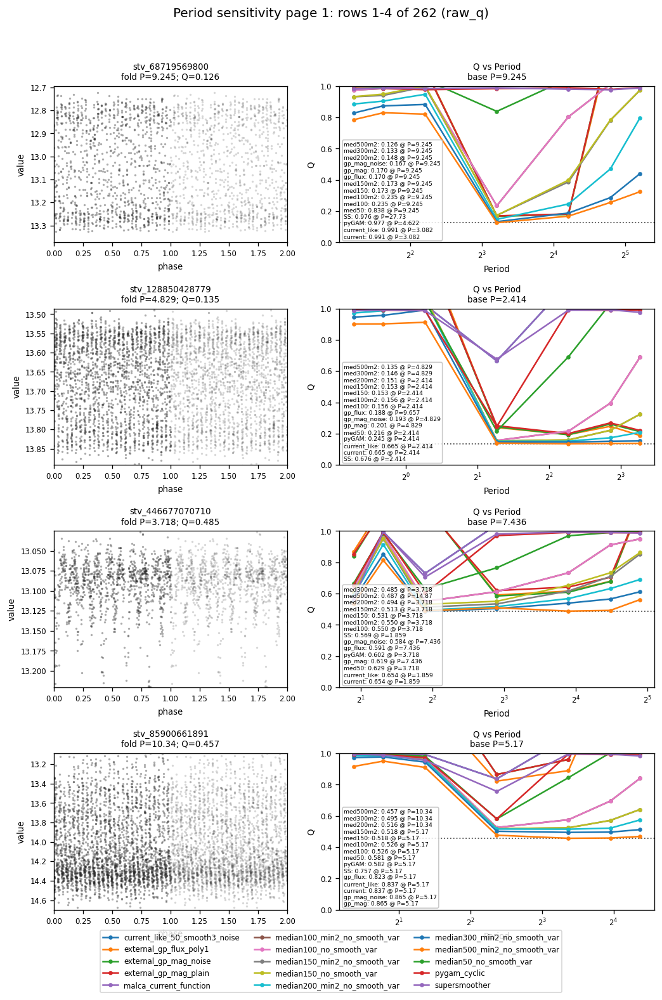

period gallery raw_q page 2: 1/4 stv_584115890976
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  3.1 to 3.1
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  4.1 to 4.1
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  6.1 to 6.1
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  12 to 12
 - Computing periods at 2 steps
Zooming

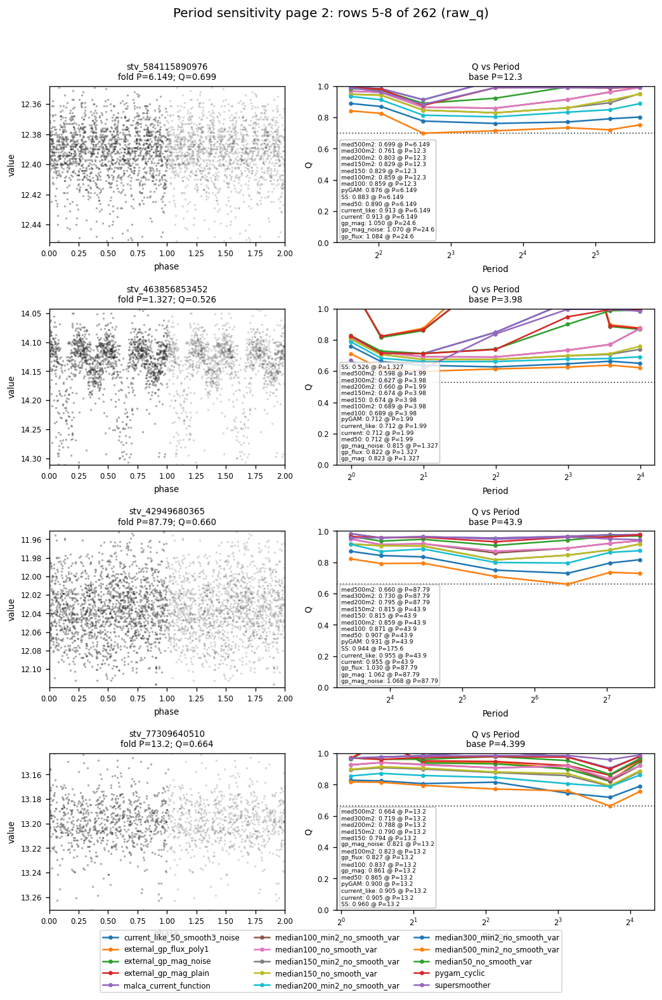

period gallery raw_q page 3: 1/4 stv_249109405037
Finding optimal frequency:
 - Estimated peak width = 0.00141
 - Using 5 steps per peak; omega_step = 0.000282
 - User-specified period range:  0.25 to 0.25
 - Computing periods at 19 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00141
 - Using 5 steps per peak; omega_step = 0.000282
 - User-specified period range:  0.34 to 0.34
 - Computing periods at 15 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00141
 - Using 5 steps per peak; omega_step = 0.000282
 - User-specified period range:  0.51 to 0.51
 - Computing periods at 10 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00141
 - Using 5 steps per peak; omega_step = 0.000282
 - User-specified period range:  1 to 1
 - Computing periods at 6 steps


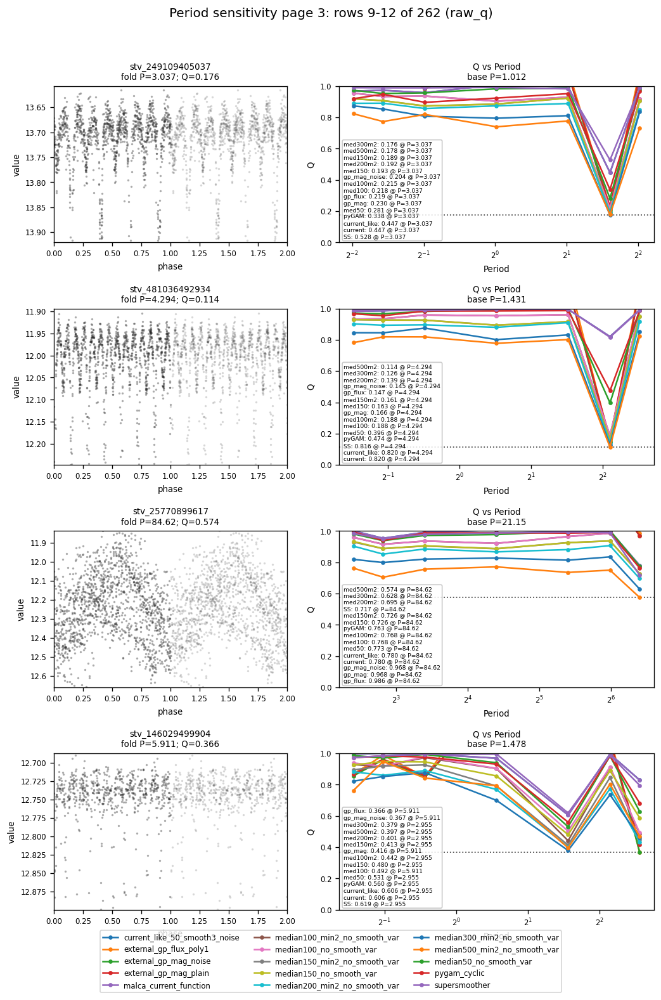

period gallery raw_q page 4: 1/4 stv_103080120065
Finding optimal frequency:
 - Estimated peak width = 0.00155
 - Using 5 steps per peak; omega_step = 0.000311
 - User-specified period range:  0.4 to 0.4
 - Computing periods at 11 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00155
 - Using 5 steps per peak; omega_step = 0.000311
 - User-specified period range:  0.54 to 0.54
 - Computing periods at 9 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00155
 - Using 5 steps per peak; omega_step = 0.000311
 - User-specified period range:  0.81 to 0.81
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00155
 - Using 5 steps per peak; omega_step = 0.000311
 - User-specified period range:  1.6 to 1.6
 - Computing periods at 4 steps


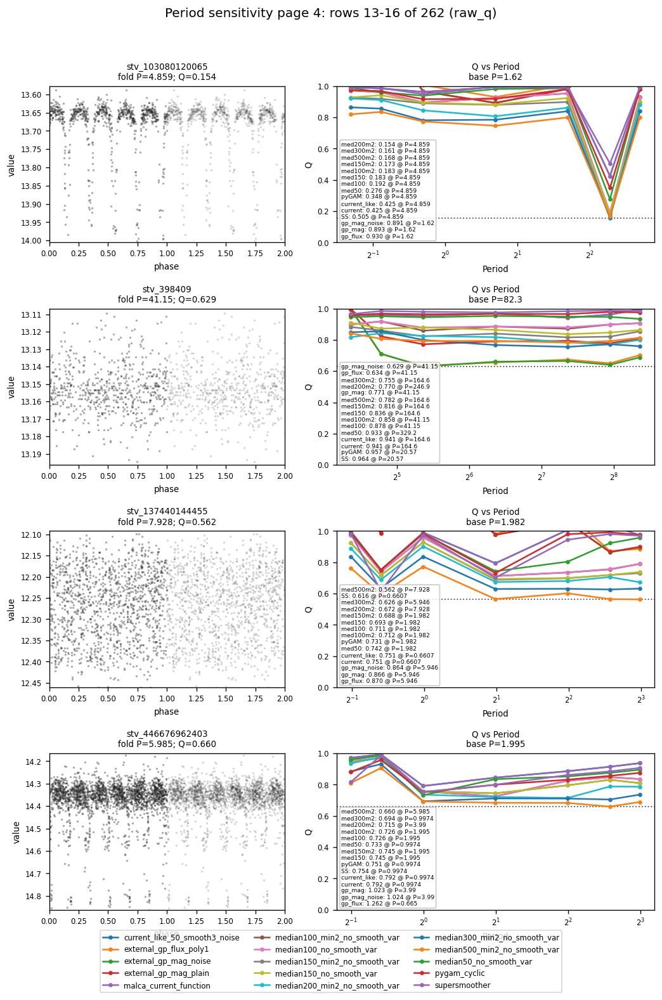

period gallery raw_q page 5: 1/4 stv_266288333107
Finding optimal frequency:
 - Estimated peak width = 0.00204
 - Using 5 steps per peak; omega_step = 0.000407
 - User-specified period range:  0.5 to 0.5
 - Computing periods at 8 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00204
 - Using 5 steps per peak; omega_step = 0.000407
 - User-specified period range:  0.66 to 0.66
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00204
 - Using 5 steps per peak; omega_step = 0.000407
 - User-specified period range:  1 to 1
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00204
 - Using 5 steps per peak; omega_step = 0.000407
 - User-specified period range:  2 to 2
 - Computing periods at 3 steps
Zooming-in 

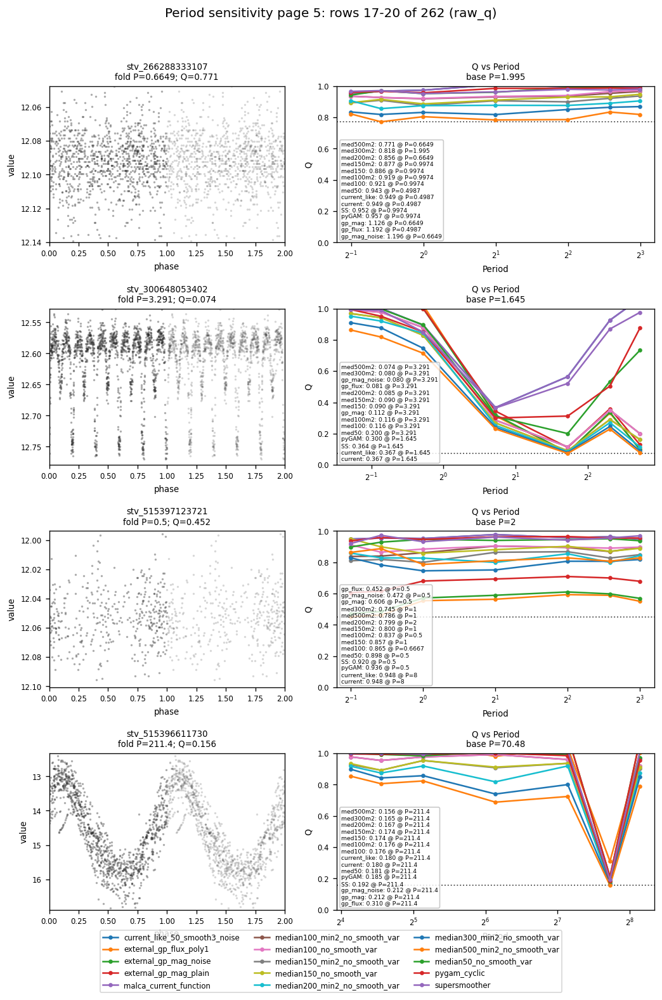

period gallery raw_q page 6: 1/4 stv_506806655985
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000289
 - User-specified period range:  1.1 to 1.1
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000289
 - User-specified period range:  1.5 to 1.5
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000289
 - User-specified period range:  2.2 to 2.2
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000289
 - User-specified period range:  4.5 to 4.5
 - Computing periods at 2 steps
Zoomi

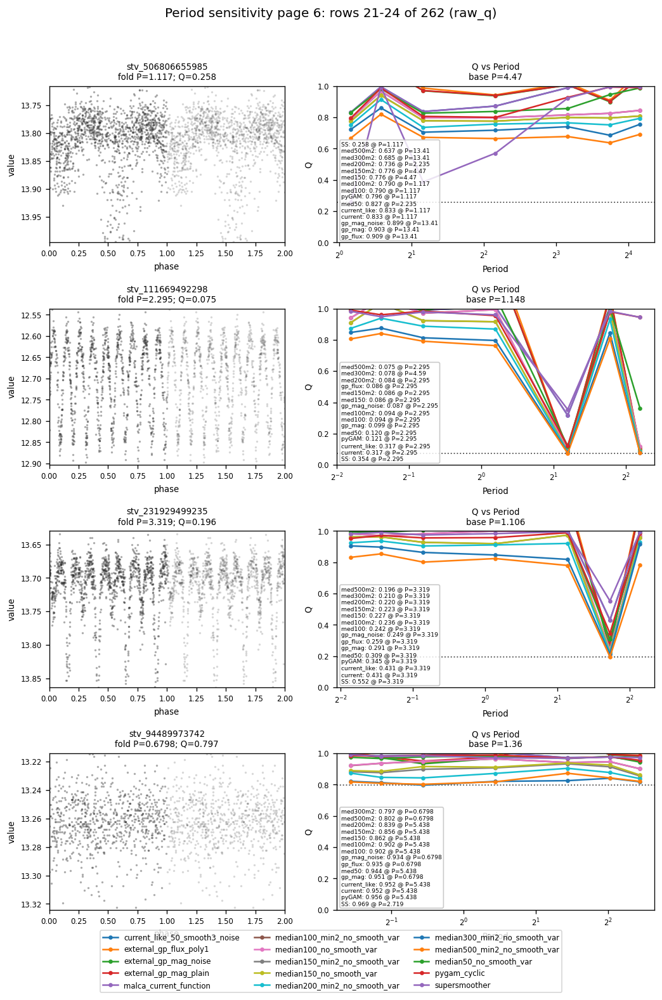

period gallery raw_q page 7: 1/4 stv_377958404305
Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000286
 - User-specified period range:  0.58 to 0.58
 - Computing periods at 9 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000286
 - User-specified period range:  0.78 to 0.78
 - Computing periods at 7 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000286
 - User-specified period range:  1.2 to 1.2
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00143
 - Using 5 steps per peak; omega_step = 0.000286
 - User-specified period range:  2.3 to 2.3
 - Computing periods at 3 steps
Z

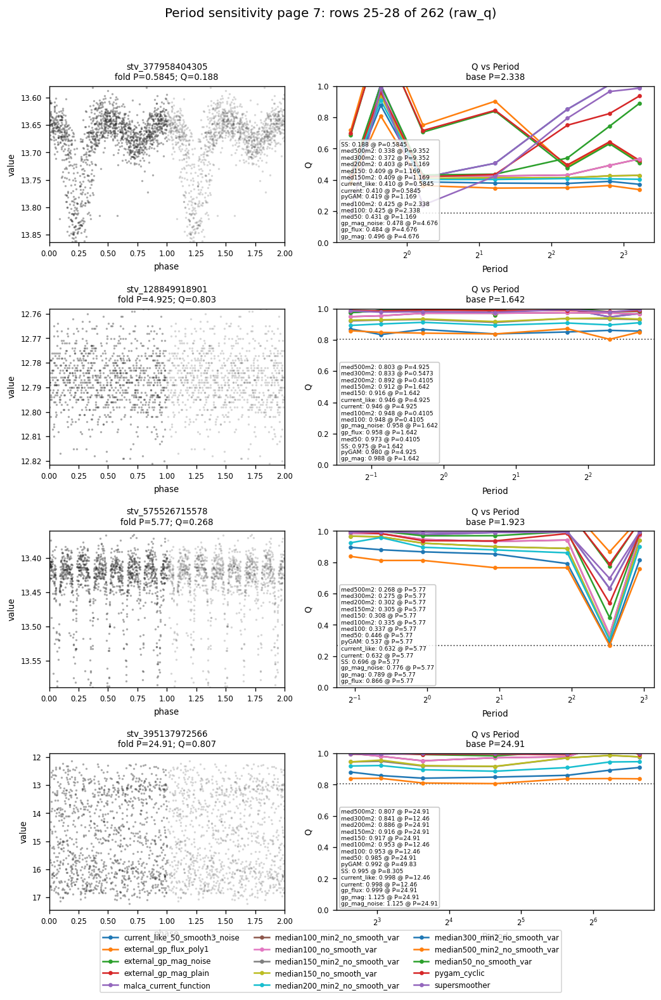

period gallery raw_q page 8: 1/4 stv_292058415124
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  22 to 22
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  29 to 29
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  44 to 44
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  87 to 88
 - Computing periods at 2 steps
Zooming-in

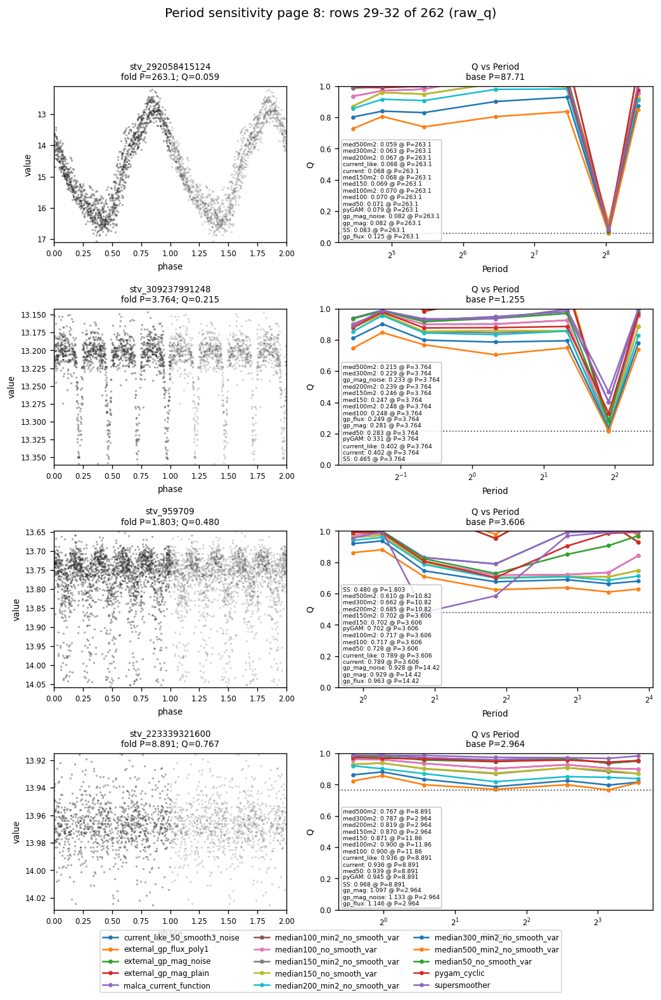

period gallery raw_q page 9: 1/4 stv_51540201147
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  0.28 to 0.28
 - Computing periods at 16 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  0.37 to 0.37
 - Computing periods at 12 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  0.56 to 0.56
 - Computing periods at 9 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  1.1 to 1.1
 - Computing periods at 5 step

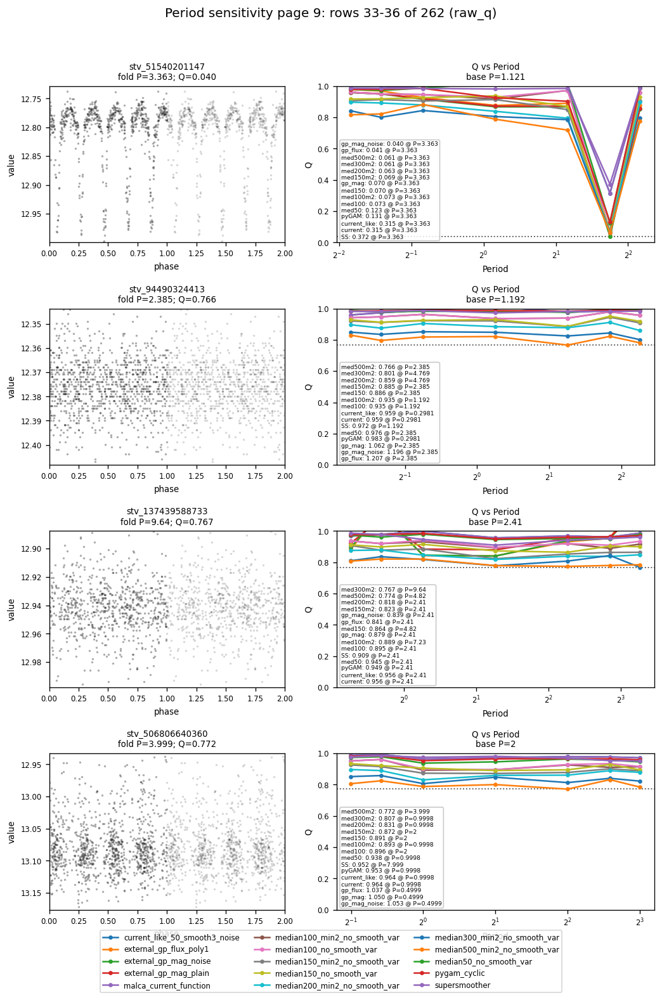

period gallery raw_q page 10: 1/4 stv_137440030067
Finding optimal frequency:
 - Estimated peak width = 0.00155
 - Using 5 steps per peak; omega_step = 0.00031
 - User-specified period range:  0.32 to 0.32
 - Computing periods at 14 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00155
 - Using 5 steps per peak; omega_step = 0.00031
 - User-specified period range:  0.43 to 0.43
 - Computing periods at 11 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00155
 - Using 5 steps per peak; omega_step = 0.00031
 - User-specified period range:  0.64 to 0.64
 - Computing periods at 8 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00155
 - Using 5 steps per peak; omega_step = 0.00031
 - User-specified period range:  1.3 to 1.3
 - Computing periods at 5 steps


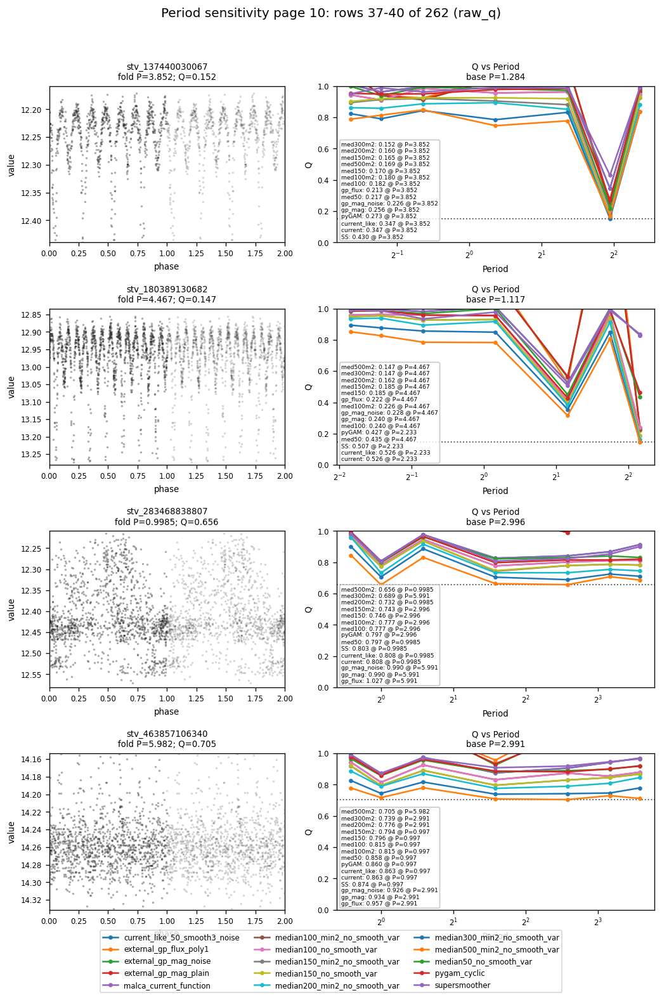

period gallery raw_q page 11: 1/4 stv_326417952456
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  0.85 to 0.85
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  1.1 to 1.1
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  1.7 to 1.7
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  3.4 to 3.4
 - Computing periods at 3 steps

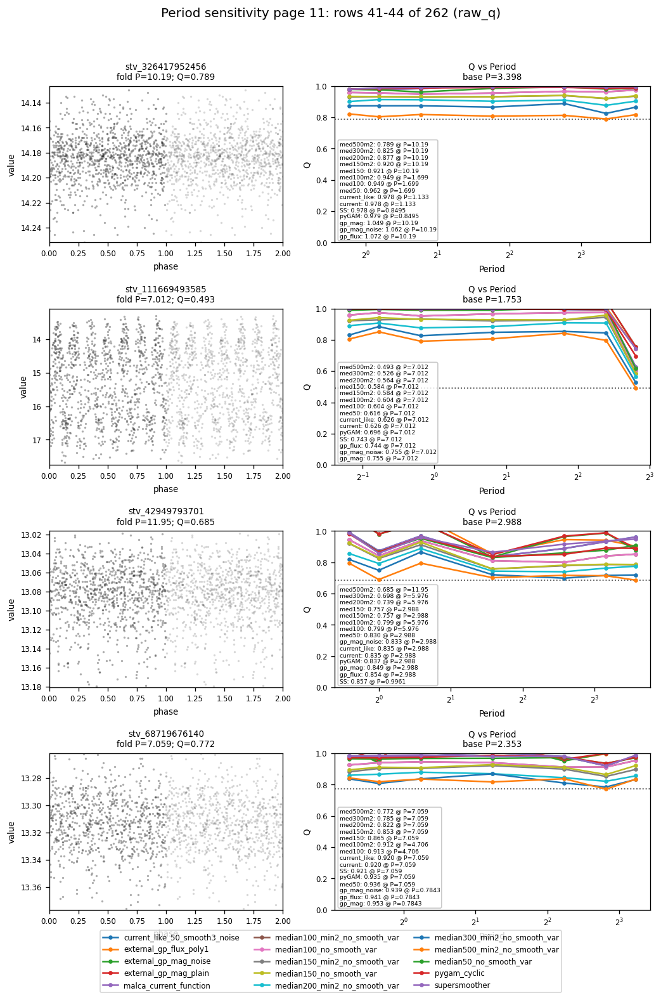

period gallery raw_q page 12: 1/4 stv_94490723040
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000309
 - User-specified period range:  0.44 to 0.44
 - Computing periods at 11 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000309
 - User-specified period range:  0.59 to 0.59
 - Computing periods at 8 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000309
 - User-specified period range:  0.89 to 0.89
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000309
 - User-specified period range:  1.8 to 1.8
 - Computing periods at 4 step

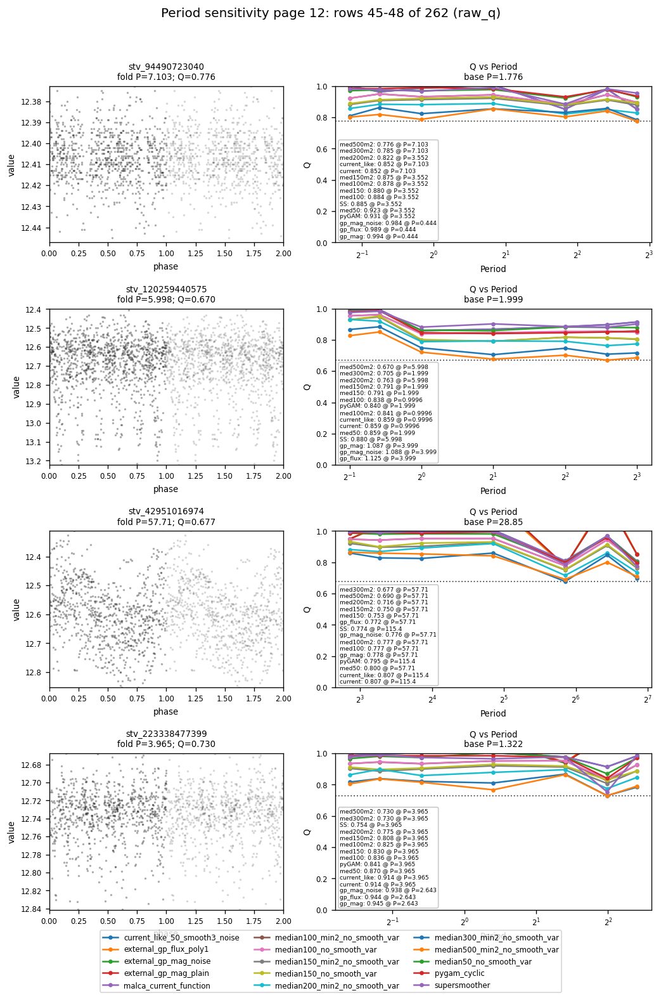

period gallery raw_q page 13: 1/4 stv_25770913921
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  14 to 14
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  18 to 18
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  27 to 27
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  55 to 55
 - Computing periods at 2 steps
Zooming-in on

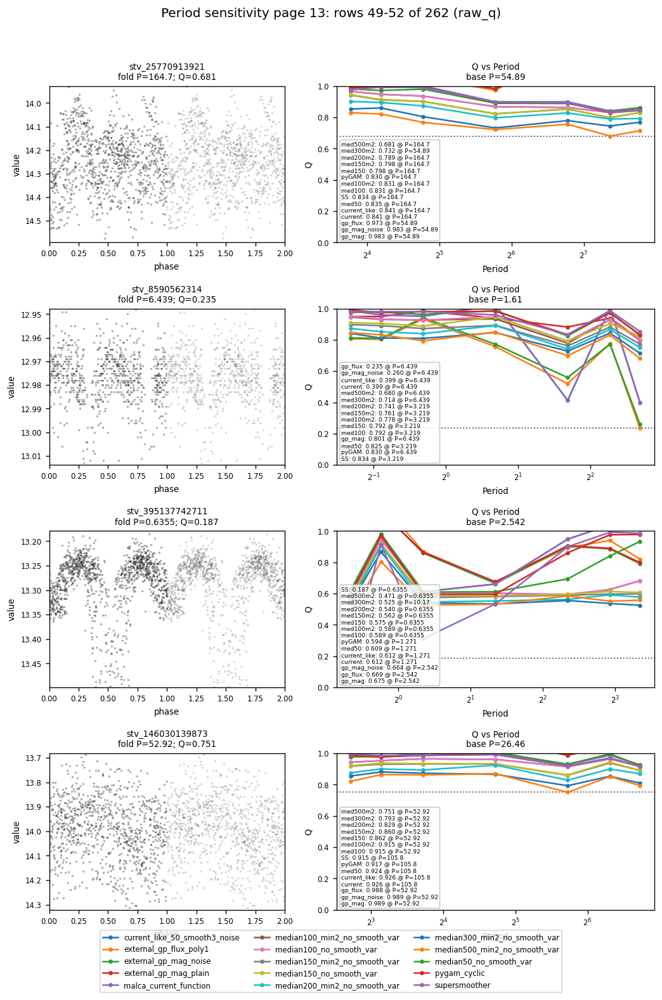

period gallery raw_q page 14: 1/4 stv_111670109164
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  0.78 to 0.78
 - Computing periods at 7 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  1 to 1
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  1.6 to 1.6
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000306
 - User-specified period range:  3.1 to 3.1
 - Computing periods at 3 steps
Zoo

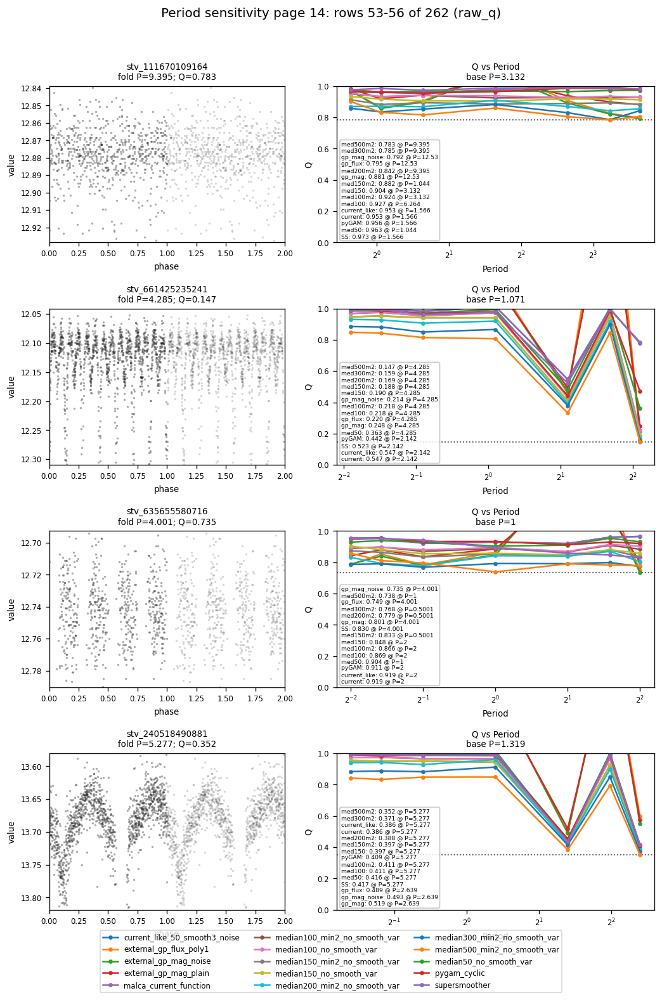

period gallery raw_q page 15: 1/4 stv_274879262781
Finding optimal frequency:
 - Estimated peak width = 0.00147
 - Using 5 steps per peak; omega_step = 0.000295
 - User-specified period range:  0.9 to 0.9
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00147
 - Using 5 steps per peak; omega_step = 0.000295
 - User-specified period range:  1.2 to 1.2
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00147
 - Using 5 steps per peak; omega_step = 0.000295
 - User-specified period range:  1.8 to 1.8
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00147
 - Using 5 steps per peak; omega_step = 0.000295
 - User-specified period range:  3.6 to 3.6
 - Computing periods at 3 steps
Zoom

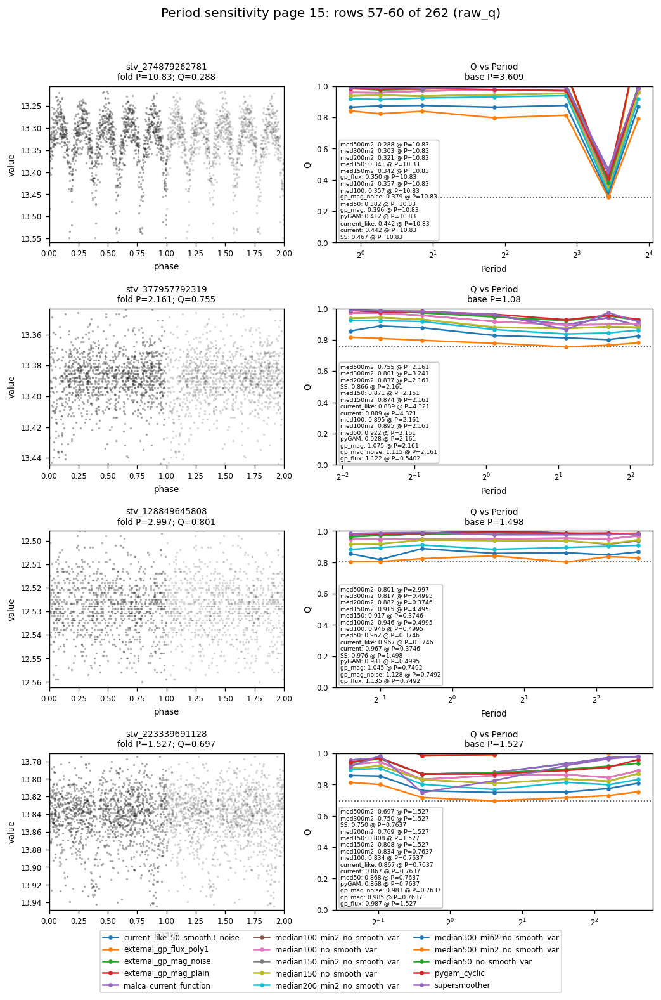

period gallery raw_q page 16: 1/4 stv_94489298987
Finding optimal frequency:
 - Estimated peak width = 0.00156
 - Using 5 steps per peak; omega_step = 0.000312
 - User-specified period range:  3.3 to 3.3
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00156
 - Using 5 steps per peak; omega_step = 0.000312
 - User-specified period range:  4.4 to 4.4
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00156
 - Using 5 steps per peak; omega_step = 0.000312
 - User-specified period range:  6.6 to 6.6
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00156
 - Using 5 steps per peak; omega_step = 0.000312
 - User-specified period range:  13 to 13
 - Computing periods at 2 steps
Zoom

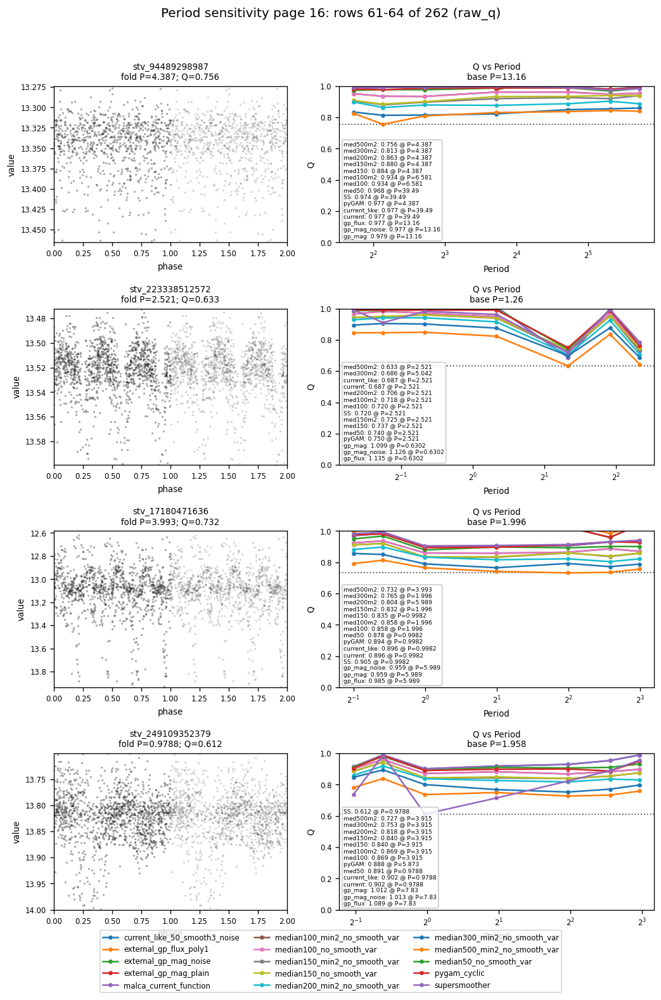

period gallery raw_q page 17: 1/4 stv_180389598698
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  1 to 1
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  1.3 to 1.3
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  2 to 2
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  4 to 4
 - Computing periods at 3 steps
Zooming-in on 5 

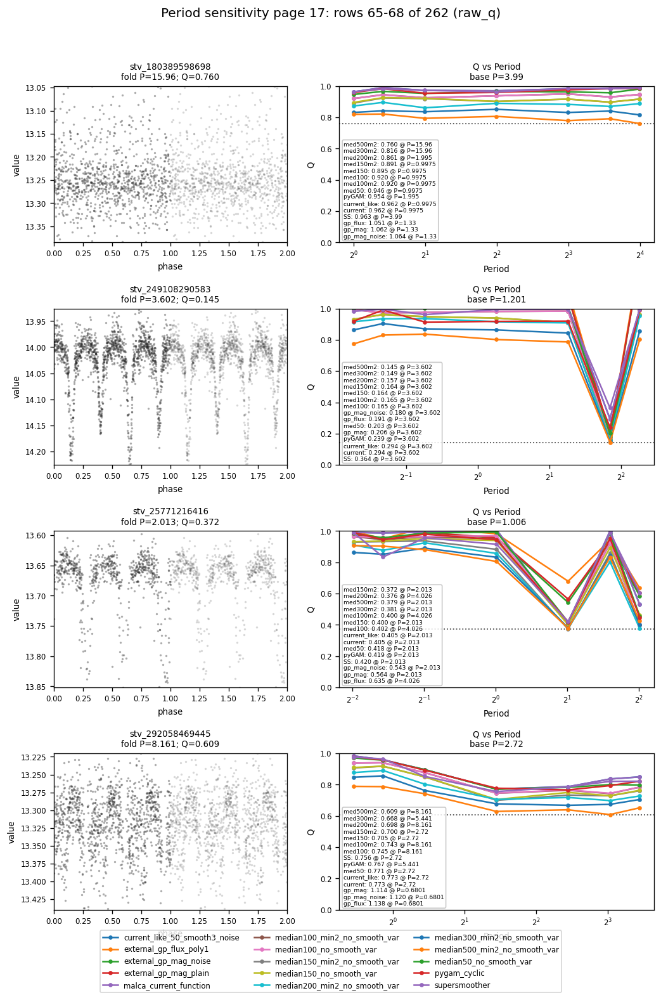

period gallery raw_q page 18: 1/4 stv_146030274302
Finding optimal frequency:
 - Estimated peak width = 0.00138
 - Using 5 steps per peak; omega_step = 0.000276
 - User-specified period range:  0.25 to 0.25
 - Computing periods at 20 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00138
 - Using 5 steps per peak; omega_step = 0.000276
 - User-specified period range:  0.34 to 0.34
 - Computing periods at 15 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00138
 - Using 5 steps per peak; omega_step = 0.000276
 - User-specified period range:  0.51 to 0.51
 - Computing periods at 11 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00138
 - Using 5 steps per peak; omega_step = 0.000276
 - User-specified period range:  1 to 1
 - Computing periods at 6 st

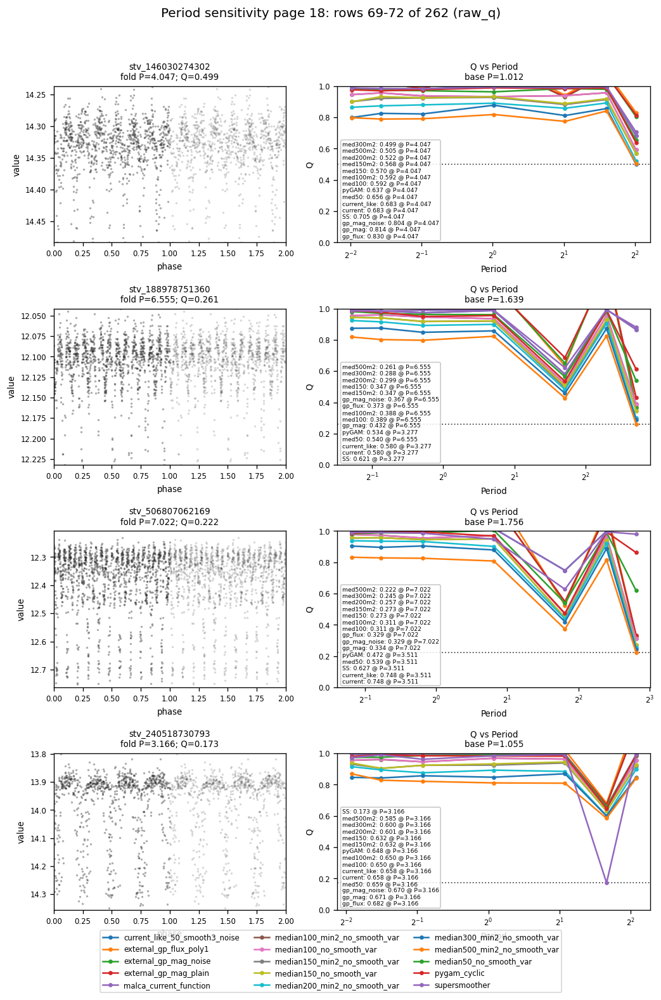

period gallery raw_q page 19: 1/4 stv_523986186357
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  0.5 to 0.5
 - Computing periods at 10 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  0.66 to 0.66
 - Computing periods at 8 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  1 to 1
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  2 to 2
 - Computing periods at 4 steps
Zooming-i

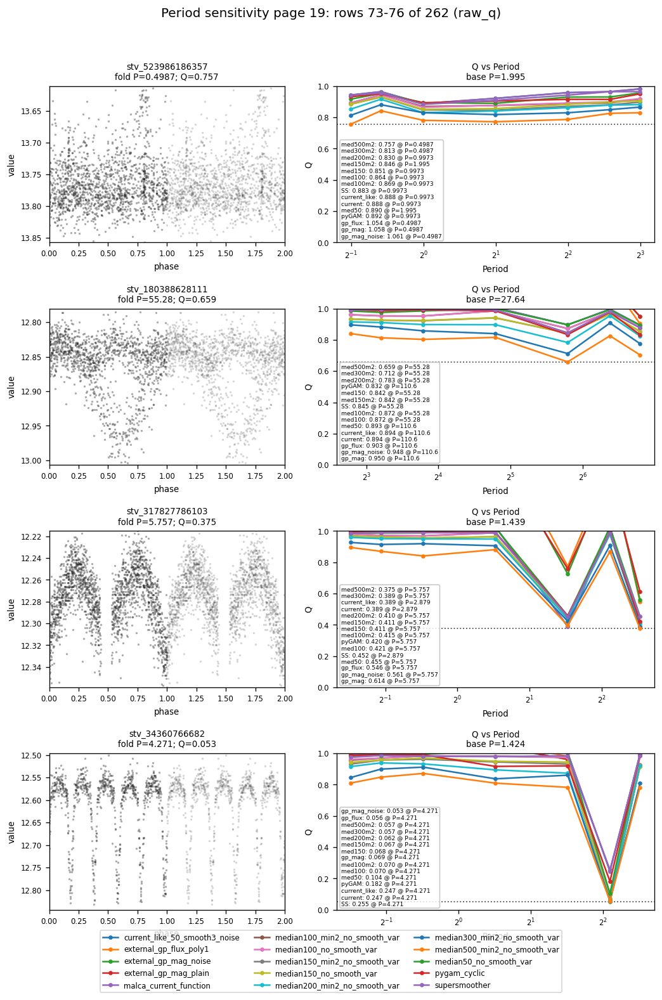

period gallery raw_q page 20: 1/4 stv_111670456954
Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000283
 - User-specified period range:  0.81 to 0.81
 - Computing periods at 7 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000283
 - User-specified period range:  1.1 to 1.1
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000283
 - User-specified period range:  1.6 to 1.6
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00142
 - Using 5 steps per peak; omega_step = 0.000283
 - User-specified period range:  3.3 to 3.3
 - Computing periods at 3 steps
Zo

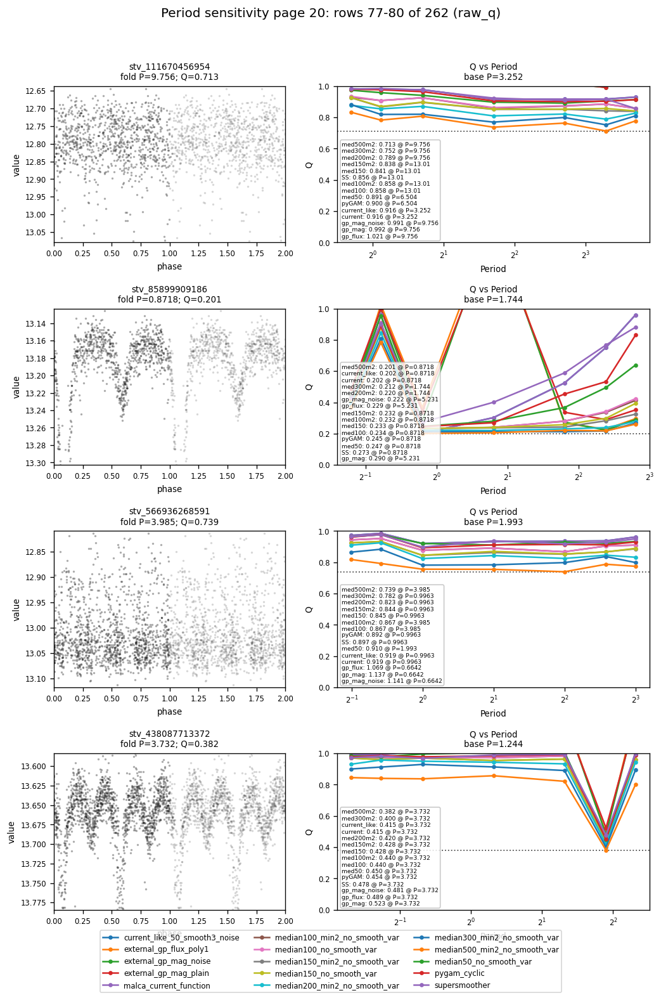

period gallery raw_q page 21: 1/4 stv_85899885158
Finding optimal frequency:
 - Estimated peak width = 0.00159
 - Using 5 steps per peak; omega_step = 0.000318
 - User-specified period range:  0.75 to 0.75
 - Computing periods at 7 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00159
 - Using 5 steps per peak; omega_step = 0.000318
 - User-specified period range:  1 to 1
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00159
 - Using 5 steps per peak; omega_step = 0.000318
 - User-specified period range:  1.5 to 1.5
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00159
 - Using 5 steps per peak; omega_step = 0.000318
 - User-specified period range:  3 to 3
 - Computing periods at 3 steps
Zooming-in 

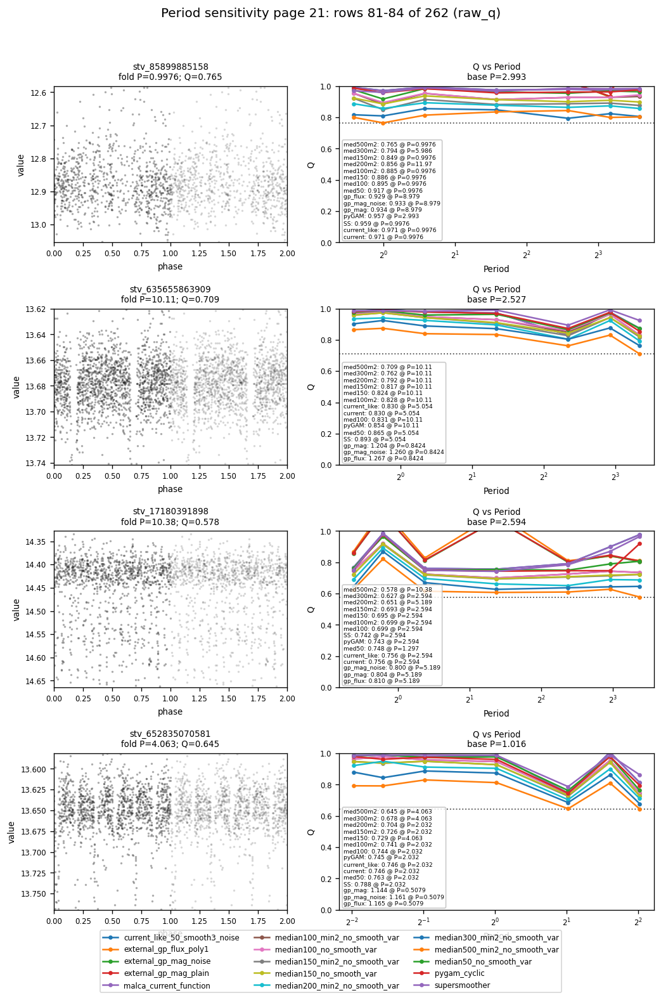

period gallery raw_q page 22: 1/4 stv_317827905285
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  0.75 to 0.75
 - Computing periods at 7 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  1 to 1
 - Computing periods at 6 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  1.5 to 1.5
 - Computing periods at 4 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00154
 - Using 5 steps per peak; omega_step = 0.000308
 - User-specified period range:  3 to 3
 - Computing periods at 3 steps
Zooming

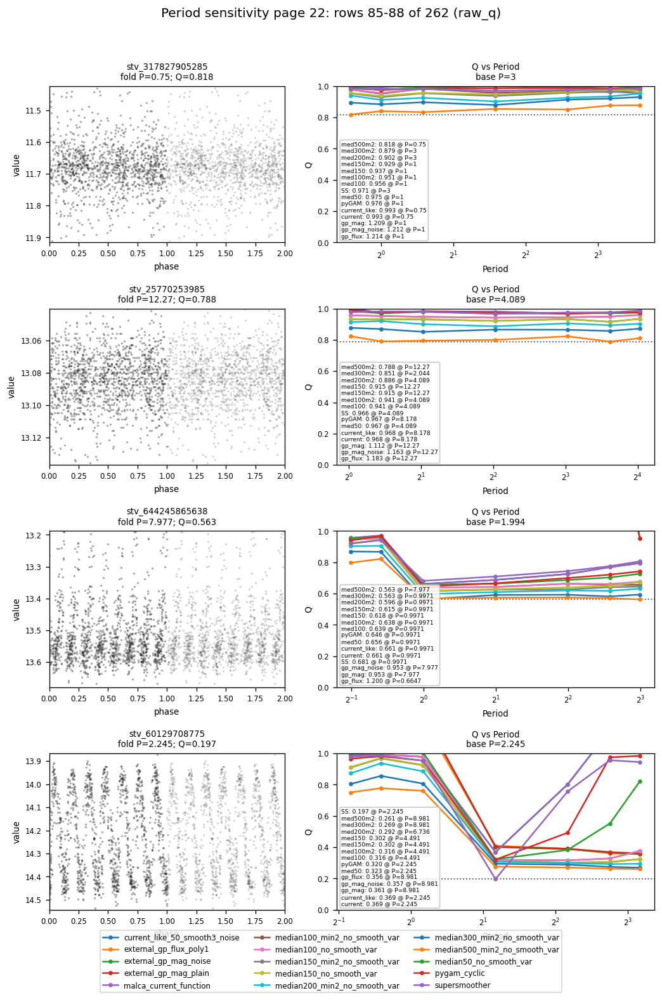

period gallery raw_q page 23: 1/4 stv_34360800532
Finding optimal frequency:
 - Estimated peak width = 0.00157
 - Using 5 steps per peak; omega_step = 0.000314
 - User-specified period range:  0.25 to 0.25
 - Computing periods at 17 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00157
 - Using 5 steps per peak; omega_step = 0.000314
 - User-specified period range:  0.33 to 0.33
 - Computing periods at 13 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00157
 - Using 5 steps per peak; omega_step = 0.000314
 - User-specified period range:  0.5 to 0.5
 - Computing periods at 9 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00157
 - Using 5 steps per peak; omega_step = 0.000314
 - User-specified period range:  1 to 1
 - Computing periods at 5 steps
Zoo

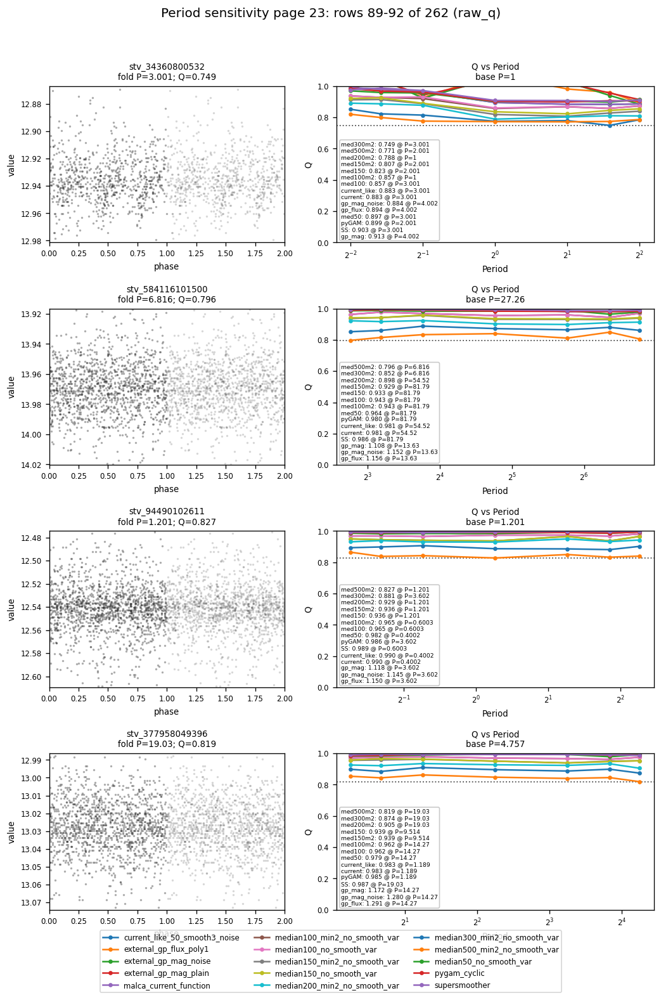

period gallery raw_q page 24: 1/4 stv_120259374523
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000307
 - User-specified period range:  0.55 to 0.55
 - Computing periods at 9 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000307
 - User-specified period range:  0.73 to 0.73
 - Computing periods at 7 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000307
 - User-specified period range:  1.1 to 1.1
 - Computing periods at 5 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00153
 - Using 5 steps per peak; omega_step = 0.000307
 - User-specified period range:  2.2 to 2.2
 - Computing periods at 3 steps


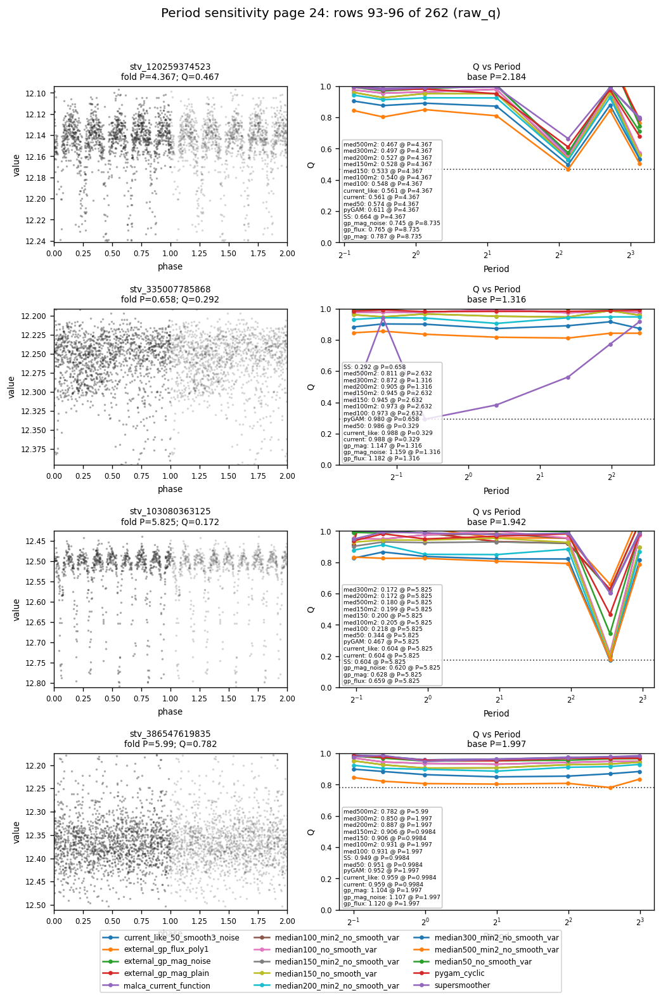

In [18]:
def period_sensitivity_gallery_selection(
    wide: pd.DataFrame,
    *,
    alt_col: str = "median150_no_smooth_var",
    n_disagree: int = 96,
    n_low: int = 48,
    n_high: int = 48,
    n_random: int = 96,
    seed: int = 987,
) -> pd.DataFrame:
    df = wide.dropna(subset=["candidate_id", "malca_current_function", alt_col]).copy()
    df["delta_current_minus_alt"] = df["malca_current_function"] - df[alt_col]
    parts = [
        _with_bucket(df.sort_values("delta_current_minus_alt", ascending=False).head(n_disagree), "current_high_alt_low"),
        _with_bucket(df.sort_values("delta_current_minus_alt", ascending=True).head(n_disagree // 2), "current_low_alt_high"),
        _with_bucket(df.sort_values("malca_current_function").head(n_low), "lowest_current_q"),
        _with_bucket(df.sort_values("malca_current_function", ascending=False).head(n_high), "highest_current_q"),
    ]
    if n_random > 0 and len(df):
        parts.append(_with_bucket(df.sample(min(n_random, len(df)), random_state=seed), "random_seed_987"))
    out = pd.concat(parts, ignore_index=True)
    out = out.drop_duplicates("candidate_id", keep="first").reset_index(drop=True)
    return out


def plot_period_sensitivity_gallery(
    selection: pd.DataFrame,
    *,
    page: int = 0,
    panels_per_page: int = 4,
    ncols: int = 1,
    mode: str = "raw_q",
    include_external_gp: bool = False,
    external_gp_max_train: int = 500,
    include_pygam: bool = RUN_PYGAM,
    pygam_max_train: int | None = None,
    include_supersmoother: bool = RUN_SUPERSMOOTHER,
    supersmoother_max_train: int | None = 2000,
    ratios: list[float] | None = None,
    q_ylim: tuple[float, float] | None = None,
) -> None:
    start = page * panels_per_page
    stop = min(start + panels_per_page, len(selection))
    chunk = selection.iloc[start:stop]
    if chunk.empty:
        print(f"No period-sensitivity rows on page {page}")
        return
    nrows = int(math.ceil(len(chunk) / ncols))
    width_ratios = []
    for _ in range(ncols):
        width_ratios.extend([1.0, 1.35])
    fig, axes = plt.subplots(
        nrows,
        2 * ncols,
        figsize=(8.8 * ncols, 3.2 * nrows),
        squeeze=False,
        gridspec_kw={"width_ratios": width_ratios},
    )
    legend_handles = None
    legend_labels = None
    used_axes = []
    for local_i, (_, item) in enumerate(chunk.iterrows(), start=1):
        cid = str(item["candidate_id"])
        print(f"period gallery {mode} page {page + 1}: {local_i}/{len(chunk)} {cid}")
        row_i = (local_i - 1) // ncols
        col_i = ((local_i - 1) % ncols) * 2
        lc_ax = axes[row_i, col_i]
        q_ax = axes[row_i, col_i + 1]
        used_axes.extend([lc_ax, q_ax])
        try:
            scan, row, base_period, source = period_sensitivity_table(
                cid,
                mode=mode,
                include_external_gp=include_external_gp,
                external_gp_max_train=external_gp_max_train,
                include_pygam=include_pygam,
                pygam_max_train=pygam_max_train,
                include_supersmoother=include_supersmoother,
                supersmoother_max_train=supersmoother_max_train,
                ratios=ratios,
            )
            minima = period_sensitivity_minima(scan)
            if len(minima):
                fold_period = float(minima.iloc[0]["period_at_q_min"])
                fold_q = float(minima.iloc[0]["q_min"])
            else:
                fold_period = float(base_period)
                fold_q = np.nan
            _row_for_lc, arrays = load_candidate_arrays(cid, mode=mode)
            phase = np.mod((arrays["time"] - np.nanmin(arrays["time"])) / fold_period, 1.0)
            values = arrays["values"]
            ok = np.isfinite(phase) & np.isfinite(values)
            lc_ax.scatter(phase[ok], values[ok], s=4, alpha=0.38, color="0.15", linewidths=0)
            lc_ax.scatter(phase[ok] + 1.0, values[ok], s=4, alpha=0.18, color="0.15", linewidths=0)
            if ok.any():
                lo, hi = np.nanpercentile(values[ok], [2, 98])
                if np.isfinite(lo) and np.isfinite(hi) and hi > lo:
                    pad = 0.12 * (hi - lo)
                    lc_ax.set_ylim(hi + pad, lo - pad)
            lc_ax.set_xlim(0, 2)
            lc_ax.set_xlabel("phase", fontsize=8)
            lc_ax.set_ylabel("value", fontsize=8)
            lc_ax.tick_params(labelsize=7)
            lc_ax.set_title(f"{cid}\nfold P={fold_period:.4g}; Q={fold_q:.3f}", fontsize=8)
            plot_period_sensitivity_table(
                scan,
                ax=q_ax,
                title="",
                legend=False,
                show=False,
                minima_short_names=True,
                minima_fontsize=5.5,
            )
            q_ax.set_title(f"Q vs Period\nbase P={base_period:.4g}", fontsize=8)
            q_ax.tick_params(labelsize=7)
            q_ax.set_xlabel("Period", fontsize=8)
            q_ax.set_ylabel("Q", fontsize=8)
            if q_ylim is not None:
                q_ax.set_ylim(*q_ylim)
            if legend_handles is None:
                legend_handles, legend_labels = q_ax.get_legend_handles_labels()
        except Exception as exc:
            lc_ax.text(0.5, 0.5, f"{cid}\n{exc}", ha="center", va="center", fontsize=7, transform=lc_ax.transAxes)
            lc_ax.set_axis_off()
            q_ax.set_axis_off()
    for ax in axes.ravel():
        if ax not in used_axes:
            ax.set_axis_off()
    if legend_handles:
        fig.legend(legend_handles, legend_labels, loc="lower center", ncols=3, fontsize=7, bbox_to_anchor=(0.5, -0.01))
    fig.suptitle(f"Period sensitivity page {page + 1}: rows {start + 1}-{stop} of {len(selection)} ({mode})", y=1.005)
    fig.tight_layout(rect=(0, 0.035, 1, 0.985))
    plt.show()


PERIOD_SENSITIVITY_GALLERY_ALT_COL = "median150_no_smooth_var"
PERIOD_SENSITIVITY_GALLERY = period_sensitivity_gallery_selection(
    sample_wide,
    alt_col=PERIOD_SENSITIVITY_GALLERY_ALT_COL,
    n_disagree=96,
    n_low=48,
    n_high=48,
    n_random=96,
)
print(f"period-sensitivity candidates: {len(PERIOD_SENSITIVITY_GALLERY)}")
display_cols = display_columns_from_frame(
    PERIOD_SENSITIVITY_GALLERY,
    leading=["bucket", "candidate_id", "asas_sn_id", "stored_q"],
    trailing=["delta_current_minus_alt"],
    include_external_gp=True,
)
display(PERIOD_SENSITIVITY_GALLERY[[col for col in display_cols if col in PERIOD_SENSITIVITY_GALLERY.columns]].head(50))

PERIOD_SENSITIVITY_PANELS_PER_PAGE = 4
PERIOD_SENSITIVITY_FAST_PAGES = 24
for page in range(min(PERIOD_SENSITIVITY_FAST_PAGES, math.ceil(len(PERIOD_SENSITIVITY_GALLERY) / PERIOD_SENSITIVITY_PANELS_PER_PAGE))):
    plot_period_sensitivity_gallery(
        PERIOD_SENSITIVITY_GALLERY,
        page=page,
        panels_per_page=PERIOD_SENSITIVITY_PANELS_PER_PAGE,
        ncols=1,
        mode="raw_q",
        include_external_gp=True,
        external_gp_max_train=500,
        include_supersmoother=RUN_SUPERSMOOTHER,
    )


## GP-Inclusive Period-Sensitivity Gallery

This runs the same gallery with the attached-code-style GP curves included. It is slower, so the default page count is lower.

period gallery review_resid page 1: 1/4 stv_68719569800
Finding optimal frequency:
 - Estimated peak width = 0.00146
 - Using 5 steps per peak; omega_step = 0.000292
 - User-specified period range:  2.3 to 2.3
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00146
 - Using 5 steps per peak; omega_step = 0.000292
 - User-specified period range:  3.1 to 3.1
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00146
 - Using 5 steps per peak; omega_step = 0.000292
 - User-specified period range:  4.6 to 4.6
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00146
 - Using 5 steps per peak; omega_step = 0.000292
 - User-specified period range:  9.2 to 9.2
 - Computing periods at 2 steps

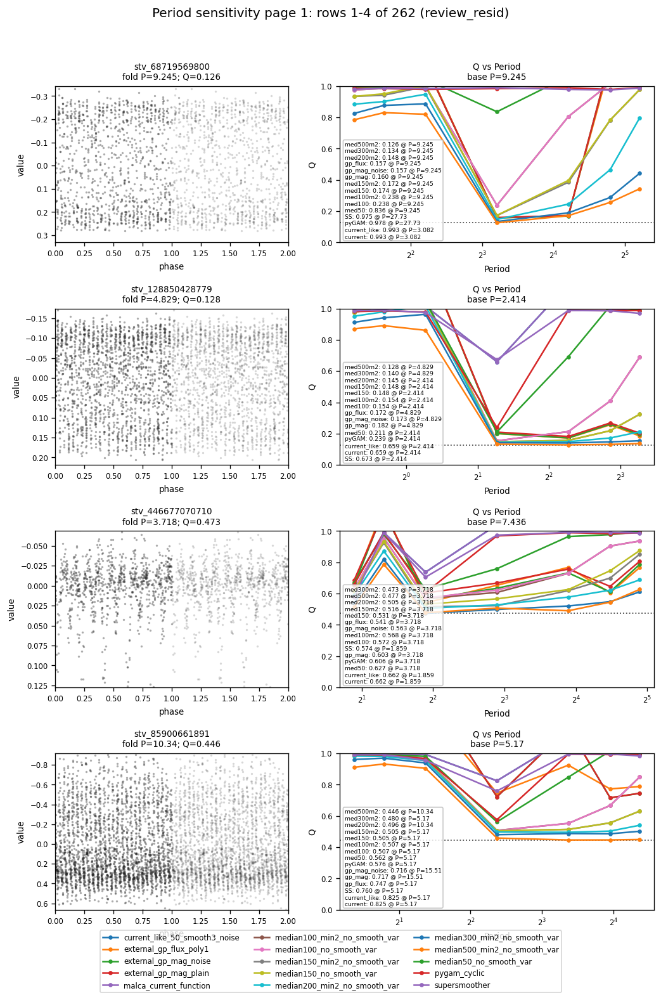

period gallery review_resid page 2: 1/4 stv_584115890976
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  3.1 to 3.1
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  4.1 to 4.1
 - Computing periods at 3 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  6.1 to 6.1
 - Computing periods at 2 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 1000 steps
Finding optimal frequency:
 - Estimated peak width = 0.00145
 - Using 5 steps per peak; omega_step = 0.000291
 - User-specified period range:  12 to 12
 - Computing periods at 2 ste

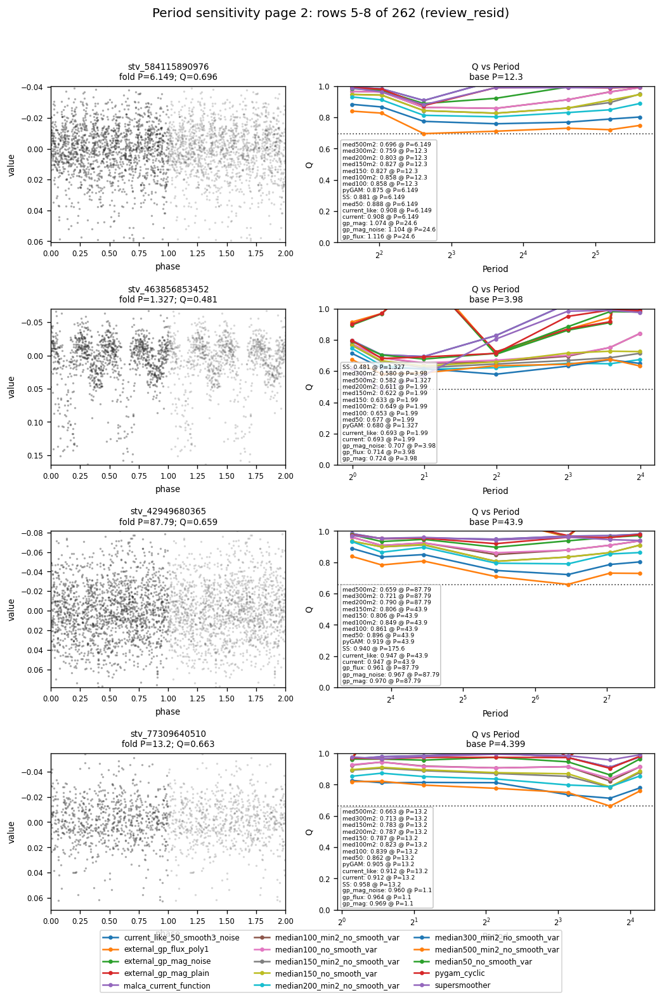

period gallery review_resid page 3: 1/4 stv_249109405037
Finding optimal frequency:
 - Estimated peak width = 0.00141
 - Using 5 steps per peak; omega_step = 0.000282
 - User-specified period range:  0.25 to 0.25
 - Computing periods at 19 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00141
 - Using 5 steps per peak; omega_step = 0.000282
 - User-specified period range:  0.34 to 0.34
 - Computing periods at 15 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00141
 - Using 5 steps per peak; omega_step = 0.000282
 - User-specified period range:  0.51 to 0.51
 - Computing periods at 10 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps
Finding optimal frequency:
 - Estimated peak width = 0.00141
 - Using 5 steps per peak; omega_step = 0.000282
 - User-specified period range:  1 to 1
 - Computing periods at 6

In [ ]:
PERIOD_SENSITIVITY_GP_PAGES = 12
PERIOD_SENSITIVITY_GP_MODE = "review_resid"
PERIOD_SENSITIVITY_GP_MAX_TRAIN = 500
for page in range(min(PERIOD_SENSITIVITY_GP_PAGES, math.ceil(len(PERIOD_SENSITIVITY_GALLERY) / PERIOD_SENSITIVITY_PANELS_PER_PAGE))):
    plot_period_sensitivity_gallery(
        PERIOD_SENSITIVITY_GALLERY,
        page=page,
        panels_per_page=PERIOD_SENSITIVITY_PANELS_PER_PAGE,
        ncols=1,
        mode=PERIOD_SENSITIVITY_GP_MODE,
        include_external_gp=True,
        external_gp_max_train=PERIOD_SENSITIVITY_GP_MAX_TRAIN,
        include_supersmoother=RUN_SUPERSMOOTHER,
    )


## SuperSmoother Period-Sensitivity Gallery

This runs the period-sensitivity gallery with `gatspy.periodic.SuperSmoother` included as the `supersmoother` curve.

In [ ]:
PERIOD_SENSITIVITY_SUPERSMOOTHER_PAGES = 6
PERIOD_SENSITIVITY_SUPERSMOOTHER_MODE = "review_resid"
PERIOD_SENSITIVITY_SUPERSMOOTHER_MAX_TRAIN = 2000
for page in range(min(PERIOD_SENSITIVITY_SUPERSMOOTHER_PAGES, math.ceil(len(PERIOD_SENSITIVITY_GALLERY) / PERIOD_SENSITIVITY_PANELS_PER_PAGE))):
    plot_period_sensitivity_gallery(
        PERIOD_SENSITIVITY_GALLERY,
        page=page,
        panels_per_page=PERIOD_SENSITIVITY_PANELS_PER_PAGE,
        ncols=1,
        mode=PERIOD_SENSITIVITY_SUPERSMOOTHER_MODE,
        include_external_gp=True,
        external_gp_max_train=500,
        include_supersmoother=True,
        supersmoother_max_train=PERIOD_SENSITIVITY_SUPERSMOOTHER_MAX_TRAIN,
    )

## Many-Light-Curve Gallery

This is the section for eyeballing lots of folds. It chooses candidates where the current Q and an alternative Q disagree, plus low-Q, high-Q, and random examples. Increase `N_GALLERY_PAGES` or `PANELS_PER_PAGE` if you want to inspect more than the default plotted set.

In [ ]:
def _tag_gallery(df: pd.DataFrame, bucket: str) -> pd.DataFrame:
    out = df.copy()
    out["gallery_bucket"] = bucket
    return out


def gallery_selection(
    wide: pd.DataFrame,
    *,
    alt_col: str = "median150_no_smooth_var",
    n_disagree: int = 80,
    n_low: int = 40,
    n_high: int = 40,
    n_random: int = 80,
    seed: int = 456,
) -> pd.DataFrame:
    df = wide.dropna(subset=["malca_current_function", alt_col]).copy()
    df["delta_current_minus_alt"] = df["malca_current_function"] - df[alt_col]
    parts = [
        _tag_gallery(df.sort_values("delta_current_minus_alt", ascending=False).head(n_disagree), "current_high_alt_low"),
        _tag_gallery(df.sort_values("delta_current_minus_alt", ascending=True).head(n_disagree // 2), "current_low_alt_high"),
        _tag_gallery(df.sort_values("malca_current_function").head(n_low), "lowest_current_q"),
        _tag_gallery(df.sort_values("malca_current_function", ascending=False).head(n_high), "highest_current_q"),
    ]
    if n_random > 0 and len(df):
        parts.append(_tag_gallery(df.sample(min(n_random, len(df)), random_state=seed), "random_seed_456"))
    out = pd.concat(parts, ignore_index=True)
    out = out.drop_duplicates("candidate_id", keep="first").reset_index(drop=True)
    return out


def _lookup_gallery_value(row: pd.Series, key: str) -> float:
    try:
        value = float(row.get(key, np.nan))
    except Exception:
        return np.nan
    return value if np.isfinite(value) else np.nan


def plot_phase_gallery(
    selection: pd.DataFrame,
    *,
    page: int = 0,
    panels_per_page: int = 24,
    ncols: int = 4,
    mode: str = "raw_q",
    template_key: str | None = None,
    template_keys: list[str] | None = None,
    overlay_current: bool = True,
    overlay_alt: bool = True,
    include_pygam: bool = RUN_PYGAM,
    pygam_max_train: int | None = None,
    include_supersmoother: bool = RUN_SUPERSMOOTHER,
    supersmoother_max_train: int | None = 2000,
    include_external_gp: bool = True,
    external_gp_max_train: int | None = 500,
) -> None:
    start = page * panels_per_page
    stop = min(start + panels_per_page, len(selection))
    chunk = selection.iloc[start:stop]
    if chunk.empty:
        print(f"No gallery rows on page {page}")
        return
    nrows = int(math.ceil(len(chunk) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 3.25 * nrows), squeeze=False)
    axes_flat = axes.ravel()
    for ax, (_, item) in zip(axes_flat, chunk.iterrows()):
        cid = str(item["candidate_id"])
        try:
            row, arrays = load_candidate_arrays(cid, mode=mode)
            period, source = period_from_row(row)
            table, results = evaluate_templates(
                arrays["time"], arrays["values"], arrays["err"], period,
                include_pygam=include_pygam, pygam_max_train=pygam_max_train,
                include_supersmoother=include_supersmoother, supersmoother_max_train=supersmoother_max_train,
            )
            if include_external_gp:
                external_rows, external_results = external_gp_rows_and_results(arrays["time"], arrays["values"], arrays["err"], period, max_train=external_gp_max_train)
                table = pd.concat([table, pd.DataFrame(external_rows)], ignore_index=True)
                results.update(external_results)
            phase = np.mod((arrays["time"] - np.nanmin(arrays["time"])) / period, 1.0)
            values = arrays["values"]
            ok = np.isfinite(phase) & np.isfinite(values)
            ax.scatter(phase[ok], values[ok], s=4, alpha=0.35, color="0.15", linewidths=0)
            ax.scatter(phase[ok] + 1.0, values[ok], s=4, alpha=0.18, color="0.15", linewidths=0)
            plot_keys = template_keys or result_plot_names(results, table, include_external_gp=include_external_gp)
            if not overlay_current:
                plot_keys = [key for key in plot_keys if key != "current_like_50_smooth3_noise"]
            if template_key and not overlay_alt and template_keys is None:
                plot_keys = [key for key in plot_keys if key != template_key]
            for key in plot_keys:
                if key in results:
                    overlay_template(ax, results[key], label=q_label(key, table), lw=1.0)
            lo, hi = np.nanpercentile(values[ok], [2, 98]) if ok.any() else (np.nan, np.nan)
            if np.isfinite(lo) and np.isfinite(hi) and hi > lo:
                pad = 0.12 * (hi - lo)
                ax.set_ylim(hi + pad, lo - pad)
            ax.text(0.01, 0.99, q_values_text(table, include_external_gp=include_external_gp), transform=ax.transAxes, va="top", ha="left", fontsize=4.2, bbox=dict(facecolor="white", edgecolor="0.85", alpha=0.72, boxstyle="round,pad=0.18"))
            ax.set_title(f"{cid}\nP={period:.3g}", fontsize=8)
            ax.set_xlim(0, 2)
            ax.tick_params(labelsize=7)
            ax.legend(fontsize=4.2, ncols=2, loc="lower right")
        except Exception as exc:
            ax.text(0.5, 0.5, f"{cid}\n{exc}", ha="center", va="center", fontsize=7, transform=ax.transAxes)
            ax.set_axis_off()
    for ax in axes_flat[len(chunk):]:
        ax.set_axis_off()
    fig.suptitle(f"Phase-fold gallery page {page + 1}: rows {start + 1}-{stop} of {len(selection)} ({mode})", y=1.002)
    fig.tight_layout()
    plt.show()


GALLERY_ALT_COL = "median150_no_smooth_var"
GALLERY = gallery_selection(sample_wide, alt_col=GALLERY_ALT_COL, n_disagree=80, n_low=40, n_high=40, n_random=80)
print(f"gallery candidates: {len(GALLERY)}")
display_cols = display_columns_from_frame(
    GALLERY,
    leading=["gallery_bucket", "candidate_id", "asas_sn_id", "stored_q"],
    trailing=["delta_current_minus_alt"],
    include_external_gp=True,
)
display(GALLERY[[col for col in display_cols if col in GALLERY.columns]].head(40))

PANELS_PER_PAGE = 24
N_GALLERY_PAGES = 4
for page in range(min(N_GALLERY_PAGES, math.ceil(len(GALLERY) / PANELS_PER_PAGE))):
    plot_phase_gallery(GALLERY, page=page, panels_per_page=PANELS_PER_PAGE, ncols=4, mode="raw_q", template_key=GALLERY_ALT_COL)

## GP-Baseline-Residual Q Type

This is the direct comparison against the light-curve representation used by MALCA review's phase panel: the per-camera masked-GP baseline is subtracted first, then the residual light curve is folded. This cell names that representation `gp_resid` so it is visually distinct from the stored/current `raw_q` representation.

In [ ]:
GP_RESID_MAX_N = 160  # GP baseline recomputation is slower; raise this if you want more.
GP_RESID_SAMPLE_IDS = SAMPLE_IDS[:min(GP_RESID_MAX_N, len(SAMPLE_IDS))]
print(f"gp_resid sample: {len(GP_RESID_SAMPLE_IDS)} light curves")

sample_gp_resid = recompute_sample(GP_RESID_SAMPLE_IDS, mode="review_resid")
sample_gp_resid_wide = sample_wide_table(sample_gp_resid)
display(sample_gp_resid_wide.head(25))


def prefix_q_columns(wide: pd.DataFrame, prefix: str) -> pd.DataFrame:
    keep = ["candidate_id", "asas_sn_id"]
    for col in ["stored_q", "period", "period_source", "mode", *FOCUS_Q_NAMES]:
        if col in wide.columns:
            keep.append(col)
    out = wide[keep].copy()
    out = out.rename(columns={col: f"{prefix}_{col}" for col in out.columns if col not in {"candidate_id", "asas_sn_id"}})
    return out


rawq_prefixed = prefix_q_columns(sample_wide, "rawq")
gp_resid_prefixed = prefix_q_columns(sample_gp_resid_wide, "gp_resid")
input_mode_compare = rawq_prefixed.merge(gp_resid_prefixed, on=["candidate_id", "asas_sn_id"], how="inner")
for name in FOCUS_Q_NAMES:
    raw_col = f"rawq_{name}"
    gp_col = f"gp_resid_{name}"
    if raw_col in input_mode_compare.columns and gp_col in input_mode_compare.columns:
        input_mode_compare[f"delta_gp_minus_raw__{name}"] = input_mode_compare[gp_col] - input_mode_compare[raw_col]
display(input_mode_compare.head(25))

mode_compare_cols = [
    name
    for name in all_template_names(include_current=True, include_external_gp=False)
    if f"rawq_{name}" in input_mode_compare.columns and f"gp_resid_{name}" in input_mode_compare.columns
]
ncols = 3
nrows = int(math.ceil(len(mode_compare_cols) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4.4 * ncols, 3.7 * nrows), squeeze=False)
for ax, name in zip(axes.ravel(), mode_compare_cols):
    raw_col = f"rawq_{name}"
    gp_col = f"gp_resid_{name}"
    sub = input_mode_compare.dropna(subset=[raw_col, gp_col])
    ax.scatter(sub[raw_col], sub[gp_col], s=16, alpha=0.65)
    if len(sub):
        lo = np.nanmin([sub[raw_col].min(), sub[gp_col].min()])
        hi = np.nanmax([sub[raw_col].max(), sub[gp_col].max()])
        ax.plot([lo, hi], [lo, hi], color="0.55", ls="--", lw=1)
    ax.set_xlabel(f"raw_q {name}")
    ax.set_ylabel(f"gp_resid {name}")
    ax.set_title(f"n={len(sub)}")
for ax in axes.ravel()[len(mode_compare_cols):]:
    ax.set_axis_off()
fig.suptitle("Same Q implementation on raw_q vs per-camera GP residual light curve", y=1.01)
fig.tight_layout()
plt.show()

GP_RESID_GALLERY_ALT_COL = "median150_no_smooth_var"
GP_RESID_GALLERY = gallery_selection(
    sample_gp_resid_wide,
    alt_col=GP_RESID_GALLERY_ALT_COL,
    n_disagree=60,
    n_low=30,
    n_high=30,
    n_random=40,
)
print(f"gp_resid gallery candidates: {len(GP_RESID_GALLERY)}")
display(GP_RESID_GALLERY[[col for col in display_cols if col in GP_RESID_GALLERY.columns]].head(40))

GP_RESID_GALLERY_PAGES = 3
for page in range(min(GP_RESID_GALLERY_PAGES, math.ceil(len(GP_RESID_GALLERY) / PANELS_PER_PAGE))):
    plot_phase_gallery(
        GP_RESID_GALLERY,
        page=page,
        panels_per_page=PANELS_PER_PAGE,
        ncols=4,
        mode="review_resid",
        template_key=GP_RESID_GALLERY_ALT_COL,
    )

## What To Look For

- If `current_like_50_smooth3_noise` is high but `median100_no_smooth_var` or `median150_no_smooth_var` is low, the current template is probably smoothing/binning away a narrow coherent feature.
- If `raw_q` and `review_resid` disagree, the Q refresh and review plot are judging different light-curve representations.
- If `gp_resid` is low while `raw_q` is high, the period/template explains the review-fold residual structure but not the un-detrended camera/band-normalized light curve.
- If noise-subtracted Q differs strongly from plain variance ratio, measurement-error subtraction is dominating the denominator.
- If 200/300-bin scores are much lower than 100/150-bin scores but coverage is poor, that may be overfitting or interpolation hallucination rather than real coherence.
- If all implementations are high, the fold likely does not explain much variance at the period being tested.

The most review-intuitive score is usually `resid_var / raw_var` or `resid_scatter / raw_scatter` on the same light-curve representation that the phase panel shows.